# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [3]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|████████████████████████████████████████████████████████| 60.0K/60.0K [00:26<00:00, 2.25KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

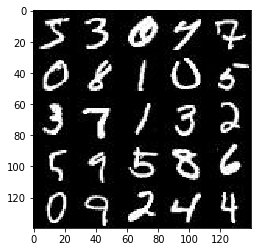

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

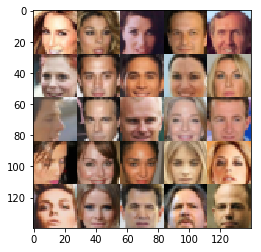

In [5]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [6]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [7]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, shape=(None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name = 'learning_rate')
    return real_input, fake_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "E:\\Anaconda\\envs\\tensorflow-gpu\\lib\\runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "E:\\Anaconda\\envs\\tensorflow-gpu\\lib\\runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "E:\\Anaconda\\envs\\tensorflow-gpu\\lib\\site-packages\\ipykernel\\__main__.py", line 3, in <module>\n    app.launch_new_instance()', 'File "E:\\Anaconda\\envs\\tensorflow-gpu\\lib\\site-packages\\traitlets\\config\\application.py", line 658, in launch_instance\n    app.start()', 'File "E:\\Anaconda\\envs\\tensorflow-gpu\\lib\\site-packages\\ipykernel\\kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "E:\\Anaconda\\envs\\tensorflow-gpu\\li

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [82]:
def discriminator(images, reuse=False, training=True, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    #kern = tf.random_normal_initializer(stddev = 0.02)
    # Xavier: initializing the weights in the network by drawing them from a distribution with zero mean 
    #and a specific variance Var(W)= 1/nin where W is the initialization distribution for the neuron in questino
    # and nin is the number of neurons feeding into it. The distribution used is typically Gaussian or uniform. 
    kern = tf.contrib.layers.xavier_initializer()
    with tf.variable_scope('discriminator', reuse=reuse): 
        #Input: 28x28x3 
        #NoteToSelf: No batch normalization on first layer
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, kernel_initializer=kern, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        #14x14x64
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, kernel_initializer=kern, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=training)
        relu2 = tf.maximum(alpha * bn2, bn2)
        #7x7x128
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, kernel_initializer=kern, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=training)
        relu3 = tf.maximum(alpha * bn3, bn3)
        #4x4x256
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1) 
        out = tf.sigmoid(logits)
 
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [83]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    #kern = kernel_initializer=tf.truncated_normal_initializer(stddev=0.02)
    kern = tf.contrib.layers.xavier_initializer()
    with tf.variable_scope('generator', reuse=not is_train):
        ## NOTE FOR FUTURE TEST
        # NoteToSelf: if padding='valid' does not work in first layer, try resizing first fully connected layer to 7x7x256 
        # and resize everything else accordingly.
        
        #first fully connected layer
        x1 = tf.layers.dense(z, 2*2*512, kernel_initializer = kern)
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        #2x2x512 now
        #convolutional layer #1
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, kernel_initializer = kern, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        #7x7x128 now
        #convolutional layer #2
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, kernel_initializer = kern, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        #28x28x64 now
        #output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 3, strides = 2, kernel_initializer = kern, padding='same') 
        '''
        x1 = tf.layers.dense(z, 7*7*256, kernel_initializer = kern) 
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        #7x7x256
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, kernel_initializer = kern, padding = 'same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        #14x14x128
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, kernel_initializer = kern, padding = 'same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3) 
        #28x28x64
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 3, strides = 1, kernel_initializer = kern, padding = 'same')
        ''' 
        out = tf.tanh(logits)
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [37]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [38]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [39]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [93]:
def train(epoch_count, batch_size, z_dim, learning_rate, 
          beta1, get_batches, data_shape, data_image_mode, 
         print_every=10, show_every=100):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    #Build the model (refer to lesson DCGAN) 
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3], alpha=0.2)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    losses = [] 
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                #ref: https://discussions.udacity.com/t/all-tests-passed-but-generator-loss-is-not-improving/248040/5
                batch_images *= 2.0
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                #_ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
            
                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode) 
                    
    return losses

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.7367... Generator Loss: 0.2501
Epoch 1/2... Discriminator Loss: 1.8115... Generator Loss: 0.2099
Epoch 1/2... Discriminator Loss: 0.7531... Generator Loss: 7.6953
Epoch 1/2... Discriminator Loss: 2.5981... Generator Loss: 0.0936
Epoch 1/2... Discriminator Loss: 1.4487... Generator Loss: 0.3601
Epoch 1/2... Discriminator Loss: 1.5733... Generator Loss: 0.3203
Epoch 1/2... Discriminator Loss: 1.8803... Generator Loss: 0.1950
Epoch 1/2... Discriminator Loss: 0.8076... Generator Loss: 5.7890
Epoch 1/2... Discriminator Loss: 0.5781... Generator Loss: 1.5001
Epoch 1/2... Discriminator Loss: 0.6895... Generator Loss: 1.1521


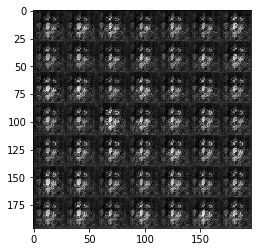

Epoch 1/2... Discriminator Loss: 0.3023... Generator Loss: 2.3148
Epoch 1/2... Discriminator Loss: 0.3200... Generator Loss: 1.8448
Epoch 1/2... Discriminator Loss: 0.4605... Generator Loss: 1.2180
Epoch 1/2... Discriminator Loss: 0.4078... Generator Loss: 2.0976
Epoch 1/2... Discriminator Loss: 0.2063... Generator Loss: 2.4209
Epoch 1/2... Discriminator Loss: 0.2521... Generator Loss: 2.1504
Epoch 1/2... Discriminator Loss: 0.4711... Generator Loss: 1.5069
Epoch 1/2... Discriminator Loss: 0.6878... Generator Loss: 0.9121
Epoch 1/2... Discriminator Loss: 0.8931... Generator Loss: 1.1583
Epoch 1/2... Discriminator Loss: 0.7001... Generator Loss: 1.0538


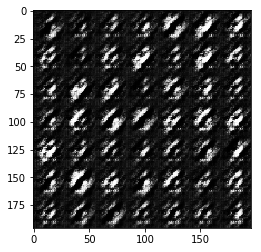

Epoch 1/2... Discriminator Loss: 0.4087... Generator Loss: 1.9876
Epoch 1/2... Discriminator Loss: 0.2441... Generator Loss: 3.1980
Epoch 1/2... Discriminator Loss: 0.2857... Generator Loss: 1.7838
Epoch 1/2... Discriminator Loss: 0.4635... Generator Loss: 3.6999
Epoch 1/2... Discriminator Loss: 1.3904... Generator Loss: 5.4065
Epoch 1/2... Discriminator Loss: 0.6495... Generator Loss: 1.2118
Epoch 1/2... Discriminator Loss: 0.1917... Generator Loss: 2.7660
Epoch 1/2... Discriminator Loss: 1.0104... Generator Loss: 0.7764
Epoch 1/2... Discriminator Loss: 0.6794... Generator Loss: 1.0140
Epoch 1/2... Discriminator Loss: 1.6606... Generator Loss: 0.3325


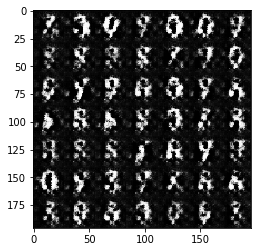

Epoch 1/2... Discriminator Loss: 0.8507... Generator Loss: 2.0094
Epoch 1/2... Discriminator Loss: 0.6824... Generator Loss: 1.0752
Epoch 1/2... Discriminator Loss: 0.4173... Generator Loss: 2.3482
Epoch 1/2... Discriminator Loss: 0.5787... Generator Loss: 1.2544
Epoch 1/2... Discriminator Loss: 0.6108... Generator Loss: 1.7417
Epoch 1/2... Discriminator Loss: 0.6592... Generator Loss: 1.3500
Epoch 1/2... Discriminator Loss: 1.5936... Generator Loss: 0.2840
Epoch 1/2... Discriminator Loss: 1.1069... Generator Loss: 1.0300
Epoch 1/2... Discriminator Loss: 0.6135... Generator Loss: 1.4081
Epoch 1/2... Discriminator Loss: 0.8172... Generator Loss: 1.7220


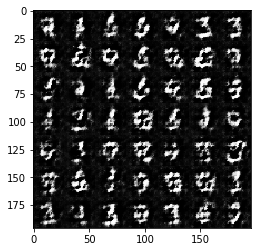

Epoch 1/2... Discriminator Loss: 1.3513... Generator Loss: 0.4077
Epoch 1/2... Discriminator Loss: 0.5954... Generator Loss: 1.3168
Epoch 1/2... Discriminator Loss: 0.8100... Generator Loss: 0.9692
Epoch 1/2... Discriminator Loss: 2.0424... Generator Loss: 0.2538
Epoch 1/2... Discriminator Loss: 0.7092... Generator Loss: 1.4193
Epoch 1/2... Discriminator Loss: 0.6931... Generator Loss: 1.6566
Epoch 1/2... Discriminator Loss: 0.6632... Generator Loss: 1.3536
Epoch 1/2... Discriminator Loss: 0.9261... Generator Loss: 0.7375
Epoch 1/2... Discriminator Loss: 0.8622... Generator Loss: 0.7702
Epoch 1/2... Discriminator Loss: 0.6583... Generator Loss: 1.7537


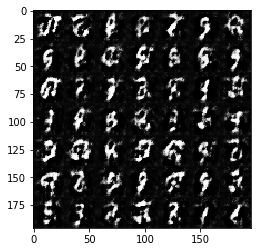

Epoch 1/2... Discriminator Loss: 0.7351... Generator Loss: 1.9924
Epoch 1/2... Discriminator Loss: 0.7020... Generator Loss: 1.4458
Epoch 1/2... Discriminator Loss: 0.6908... Generator Loss: 2.4571
Epoch 1/2... Discriminator Loss: 0.7087... Generator Loss: 2.7505
Epoch 1/2... Discriminator Loss: 0.7242... Generator Loss: 1.4463
Epoch 1/2... Discriminator Loss: 0.9209... Generator Loss: 2.8116
Epoch 1/2... Discriminator Loss: 1.3522... Generator Loss: 2.9879
Epoch 1/2... Discriminator Loss: 1.4053... Generator Loss: 0.4415
Epoch 1/2... Discriminator Loss: 0.6433... Generator Loss: 1.1736
Epoch 1/2... Discriminator Loss: 0.8226... Generator Loss: 0.8501


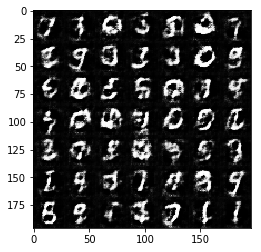

Epoch 1/2... Discriminator Loss: 1.0429... Generator Loss: 0.7350
Epoch 1/2... Discriminator Loss: 0.9979... Generator Loss: 2.0269
Epoch 1/2... Discriminator Loss: 0.9761... Generator Loss: 1.6128
Epoch 1/2... Discriminator Loss: 1.2259... Generator Loss: 0.4900
Epoch 1/2... Discriminator Loss: 0.9313... Generator Loss: 0.7512
Epoch 1/2... Discriminator Loss: 0.8709... Generator Loss: 0.7383
Epoch 1/2... Discriminator Loss: 0.9004... Generator Loss: 2.2122
Epoch 1/2... Discriminator Loss: 0.7152... Generator Loss: 1.1360
Epoch 1/2... Discriminator Loss: 1.8720... Generator Loss: 0.2127
Epoch 1/2... Discriminator Loss: 0.7414... Generator Loss: 0.9870


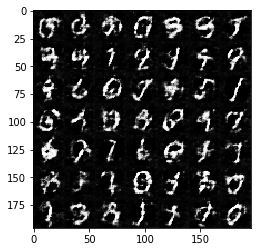

Epoch 1/2... Discriminator Loss: 1.2280... Generator Loss: 0.4054
Epoch 1/2... Discriminator Loss: 0.8409... Generator Loss: 1.1297
Epoch 1/2... Discriminator Loss: 0.9361... Generator Loss: 1.7294
Epoch 1/2... Discriminator Loss: 1.5937... Generator Loss: 0.2781
Epoch 1/2... Discriminator Loss: 0.8521... Generator Loss: 0.8037
Epoch 1/2... Discriminator Loss: 0.4517... Generator Loss: 1.8074
Epoch 1/2... Discriminator Loss: 0.9208... Generator Loss: 0.8816
Epoch 1/2... Discriminator Loss: 1.4771... Generator Loss: 0.3690
Epoch 1/2... Discriminator Loss: 1.1745... Generator Loss: 0.4726
Epoch 1/2... Discriminator Loss: 1.4295... Generator Loss: 0.4164


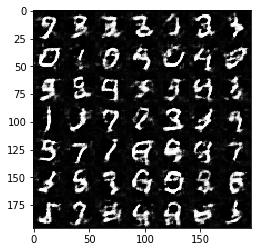

Epoch 1/2... Discriminator Loss: 0.9396... Generator Loss: 0.6417
Epoch 1/2... Discriminator Loss: 1.4568... Generator Loss: 0.3300
Epoch 1/2... Discriminator Loss: 1.6383... Generator Loss: 0.2891
Epoch 1/2... Discriminator Loss: 0.6492... Generator Loss: 1.7404
Epoch 1/2... Discriminator Loss: 0.7187... Generator Loss: 1.5119
Epoch 1/2... Discriminator Loss: 1.1337... Generator Loss: 0.5336
Epoch 1/2... Discriminator Loss: 1.3350... Generator Loss: 0.4354
Epoch 1/2... Discriminator Loss: 1.5227... Generator Loss: 0.3009
Epoch 1/2... Discriminator Loss: 0.8778... Generator Loss: 1.1225
Epoch 1/2... Discriminator Loss: 0.6505... Generator Loss: 1.2350


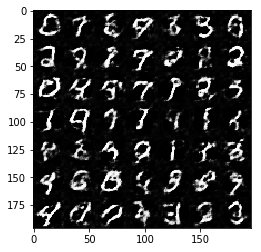

Epoch 1/2... Discriminator Loss: 0.9863... Generator Loss: 0.7671
Epoch 1/2... Discriminator Loss: 0.8134... Generator Loss: 1.1397
Epoch 1/2... Discriminator Loss: 1.1279... Generator Loss: 0.5285
Epoch 1/2... Discriminator Loss: 0.8668... Generator Loss: 0.9579
Epoch 1/2... Discriminator Loss: 0.7278... Generator Loss: 2.2686
Epoch 1/2... Discriminator Loss: 0.8971... Generator Loss: 0.7643
Epoch 1/2... Discriminator Loss: 1.3064... Generator Loss: 0.4505
Epoch 1/2... Discriminator Loss: 0.6848... Generator Loss: 1.8371
Epoch 1/2... Discriminator Loss: 1.0483... Generator Loss: 0.5649
Epoch 1/2... Discriminator Loss: 1.0738... Generator Loss: 0.6479


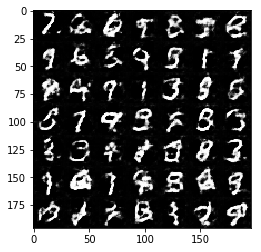

Epoch 1/2... Discriminator Loss: 1.4002... Generator Loss: 0.3875
Epoch 1/2... Discriminator Loss: 0.7106... Generator Loss: 1.7824
Epoch 1/2... Discriminator Loss: 0.9275... Generator Loss: 0.9546
Epoch 1/2... Discriminator Loss: 0.9800... Generator Loss: 0.7343
Epoch 1/2... Discriminator Loss: 0.8963... Generator Loss: 0.7045
Epoch 1/2... Discriminator Loss: 0.7183... Generator Loss: 1.2752
Epoch 1/2... Discriminator Loss: 0.6606... Generator Loss: 1.2002
Epoch 1/2... Discriminator Loss: 0.9410... Generator Loss: 0.8675
Epoch 1/2... Discriminator Loss: 0.8930... Generator Loss: 0.7009
Epoch 1/2... Discriminator Loss: 0.7836... Generator Loss: 1.8432


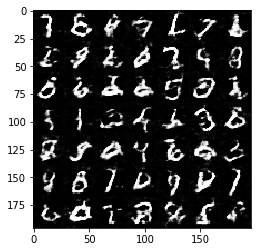

Epoch 1/2... Discriminator Loss: 1.9821... Generator Loss: 0.2021
Epoch 1/2... Discriminator Loss: 0.9395... Generator Loss: 0.6494
Epoch 1/2... Discriminator Loss: 0.7708... Generator Loss: 0.9130
Epoch 1/2... Discriminator Loss: 2.0940... Generator Loss: 3.8835
Epoch 1/2... Discriminator Loss: 0.7618... Generator Loss: 0.8648
Epoch 1/2... Discriminator Loss: 0.7956... Generator Loss: 0.9014
Epoch 1/2... Discriminator Loss: 0.7759... Generator Loss: 0.9657
Epoch 1/2... Discriminator Loss: 0.9139... Generator Loss: 1.4707
Epoch 1/2... Discriminator Loss: 0.7655... Generator Loss: 1.4443
Epoch 1/2... Discriminator Loss: 0.5956... Generator Loss: 2.0490


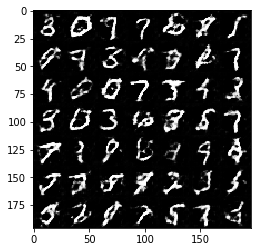

Epoch 1/2... Discriminator Loss: 1.2563... Generator Loss: 0.6553
Epoch 1/2... Discriminator Loss: 1.0779... Generator Loss: 0.5630
Epoch 1/2... Discriminator Loss: 0.9614... Generator Loss: 0.8365
Epoch 1/2... Discriminator Loss: 0.7918... Generator Loss: 0.8867
Epoch 1/2... Discriminator Loss: 0.9547... Generator Loss: 0.6789
Epoch 1/2... Discriminator Loss: 0.7583... Generator Loss: 1.5869
Epoch 1/2... Discriminator Loss: 1.8350... Generator Loss: 2.9481
Epoch 1/2... Discriminator Loss: 0.7561... Generator Loss: 0.9307
Epoch 1/2... Discriminator Loss: 1.1575... Generator Loss: 0.4641
Epoch 1/2... Discriminator Loss: 0.9862... Generator Loss: 0.6550


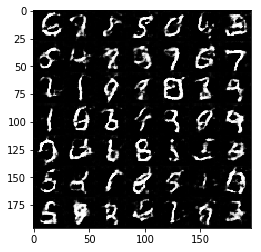

Epoch 1/2... Discriminator Loss: 0.7051... Generator Loss: 1.1010
Epoch 1/2... Discriminator Loss: 0.9109... Generator Loss: 0.7361
Epoch 1/2... Discriminator Loss: 1.6824... Generator Loss: 0.2734
Epoch 1/2... Discriminator Loss: 0.8047... Generator Loss: 0.8265
Epoch 1/2... Discriminator Loss: 1.3501... Generator Loss: 0.4661
Epoch 1/2... Discriminator Loss: 1.9824... Generator Loss: 0.2093
Epoch 1/2... Discriminator Loss: 1.1477... Generator Loss: 0.5287
Epoch 1/2... Discriminator Loss: 0.7207... Generator Loss: 1.0175
Epoch 1/2... Discriminator Loss: 0.9730... Generator Loss: 0.5915
Epoch 1/2... Discriminator Loss: 0.9279... Generator Loss: 0.7337


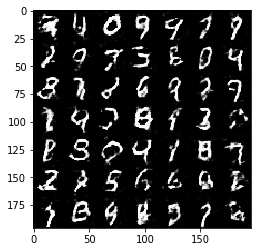

Epoch 1/2... Discriminator Loss: 1.7383... Generator Loss: 0.2398
Epoch 1/2... Discriminator Loss: 1.1868... Generator Loss: 0.5104
Epoch 1/2... Discriminator Loss: 0.7715... Generator Loss: 2.3363
Epoch 1/2... Discriminator Loss: 1.9327... Generator Loss: 3.5041
Epoch 1/2... Discriminator Loss: 0.9762... Generator Loss: 0.6516
Epoch 1/2... Discriminator Loss: 0.7425... Generator Loss: 1.3084
Epoch 1/2... Discriminator Loss: 1.1538... Generator Loss: 0.5209
Epoch 1/2... Discriminator Loss: 0.5147... Generator Loss: 1.2718
Epoch 1/2... Discriminator Loss: 0.9960... Generator Loss: 2.0265
Epoch 1/2... Discriminator Loss: 0.7107... Generator Loss: 0.8869


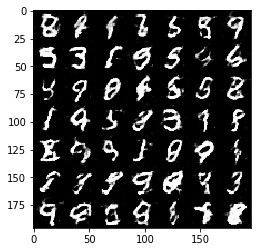

Epoch 1/2... Discriminator Loss: 1.2233... Generator Loss: 0.4862
Epoch 1/2... Discriminator Loss: 1.8383... Generator Loss: 0.2940
Epoch 1/2... Discriminator Loss: 1.0856... Generator Loss: 0.5975
Epoch 1/2... Discriminator Loss: 0.6550... Generator Loss: 1.1166
Epoch 1/2... Discriminator Loss: 0.7972... Generator Loss: 0.8116
Epoch 1/2... Discriminator Loss: 1.1532... Generator Loss: 0.4776
Epoch 1/2... Discriminator Loss: 0.8290... Generator Loss: 0.7489
Epoch 1/2... Discriminator Loss: 1.9060... Generator Loss: 0.2383
Epoch 1/2... Discriminator Loss: 1.2647... Generator Loss: 0.4685
Epoch 1/2... Discriminator Loss: 1.1628... Generator Loss: 0.5398


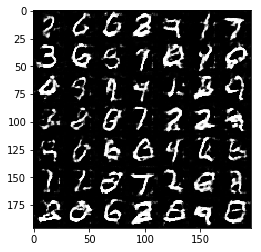

Epoch 1/2... Discriminator Loss: 1.0304... Generator Loss: 0.6300
Epoch 1/2... Discriminator Loss: 1.0252... Generator Loss: 0.7139
Epoch 1/2... Discriminator Loss: 0.6041... Generator Loss: 1.2007
Epoch 1/2... Discriminator Loss: 0.8282... Generator Loss: 0.8562
Epoch 1/2... Discriminator Loss: 0.5216... Generator Loss: 1.4966
Epoch 1/2... Discriminator Loss: 0.7245... Generator Loss: 0.9128
Epoch 1/2... Discriminator Loss: 1.0473... Generator Loss: 0.5435
Epoch 1/2... Discriminator Loss: 0.3970... Generator Loss: 1.7123
Epoch 1/2... Discriminator Loss: 2.2817... Generator Loss: 0.1847
Epoch 1/2... Discriminator Loss: 0.8202... Generator Loss: 0.8578


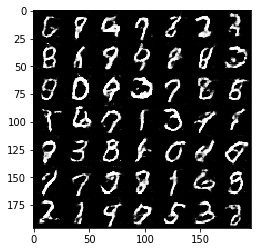

Epoch 1/2... Discriminator Loss: 0.7709... Generator Loss: 0.9612
Epoch 1/2... Discriminator Loss: 0.3672... Generator Loss: 2.2574
Epoch 1/2... Discriminator Loss: 1.1281... Generator Loss: 0.5464
Epoch 1/2... Discriminator Loss: 0.9183... Generator Loss: 1.7674
Epoch 1/2... Discriminator Loss: 1.0924... Generator Loss: 0.6157
Epoch 1/2... Discriminator Loss: 0.8044... Generator Loss: 0.8728
Epoch 1/2... Discriminator Loss: 2.1348... Generator Loss: 0.1790
Epoch 1/2... Discriminator Loss: 0.8420... Generator Loss: 0.8208
Epoch 1/2... Discriminator Loss: 0.7945... Generator Loss: 0.7936
Epoch 1/2... Discriminator Loss: 0.5581... Generator Loss: 1.2751


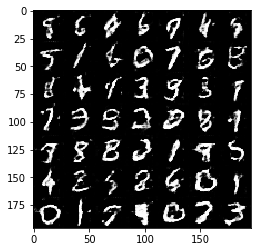

Epoch 1/2... Discriminator Loss: 0.7658... Generator Loss: 1.1058
Epoch 1/2... Discriminator Loss: 0.6557... Generator Loss: 1.0630
Epoch 1/2... Discriminator Loss: 2.4067... Generator Loss: 0.1434
Epoch 1/2... Discriminator Loss: 0.4912... Generator Loss: 1.5887
Epoch 1/2... Discriminator Loss: 1.1523... Generator Loss: 0.5175
Epoch 1/2... Discriminator Loss: 0.9867... Generator Loss: 0.6985
Epoch 1/2... Discriminator Loss: 0.5813... Generator Loss: 1.1127
Epoch 2/2... Discriminator Loss: 0.7217... Generator Loss: 1.0020
Epoch 2/2... Discriminator Loss: 1.6036... Generator Loss: 0.3429
Epoch 2/2... Discriminator Loss: 0.5921... Generator Loss: 1.2402


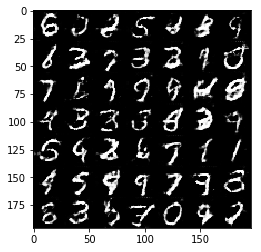

Epoch 2/2... Discriminator Loss: 1.0012... Generator Loss: 0.5710
Epoch 2/2... Discriminator Loss: 0.8091... Generator Loss: 0.8329
Epoch 2/2... Discriminator Loss: 0.8014... Generator Loss: 0.8701
Epoch 2/2... Discriminator Loss: 1.3427... Generator Loss: 2.1892
Epoch 2/2... Discriminator Loss: 2.1909... Generator Loss: 0.1852
Epoch 2/2... Discriminator Loss: 1.0847... Generator Loss: 0.5936
Epoch 2/2... Discriminator Loss: 1.4784... Generator Loss: 0.3300
Epoch 2/2... Discriminator Loss: 0.8915... Generator Loss: 0.7411
Epoch 2/2... Discriminator Loss: 0.8852... Generator Loss: 0.7221
Epoch 2/2... Discriminator Loss: 0.6580... Generator Loss: 1.0720


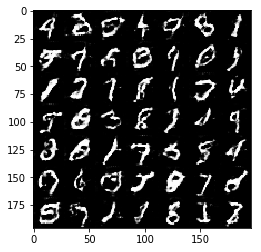

Epoch 2/2... Discriminator Loss: 0.6161... Generator Loss: 1.0544
Epoch 2/2... Discriminator Loss: 0.7381... Generator Loss: 0.8635
Epoch 2/2... Discriminator Loss: 1.6546... Generator Loss: 0.3173
Epoch 2/2... Discriminator Loss: 0.5224... Generator Loss: 1.3387
Epoch 2/2... Discriminator Loss: 1.0142... Generator Loss: 0.5918
Epoch 2/2... Discriminator Loss: 0.5696... Generator Loss: 1.1030
Epoch 2/2... Discriminator Loss: 0.5260... Generator Loss: 1.2415
Epoch 2/2... Discriminator Loss: 1.5210... Generator Loss: 0.3163
Epoch 2/2... Discriminator Loss: 0.8063... Generator Loss: 1.3096
Epoch 2/2... Discriminator Loss: 1.4610... Generator Loss: 0.3571


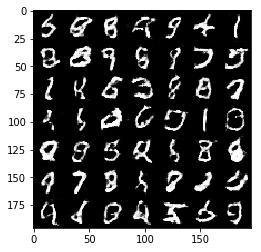

Epoch 2/2... Discriminator Loss: 1.0358... Generator Loss: 0.5581
Epoch 2/2... Discriminator Loss: 0.7041... Generator Loss: 0.9630
Epoch 2/2... Discriminator Loss: 0.8562... Generator Loss: 0.7630
Epoch 2/2... Discriminator Loss: 1.0674... Generator Loss: 0.5401
Epoch 2/2... Discriminator Loss: 0.8118... Generator Loss: 0.8807
Epoch 2/2... Discriminator Loss: 1.2552... Generator Loss: 0.4682
Epoch 2/2... Discriminator Loss: 1.9006... Generator Loss: 0.2198
Epoch 2/2... Discriminator Loss: 0.5870... Generator Loss: 1.3691
Epoch 2/2... Discriminator Loss: 0.7517... Generator Loss: 0.8798
Epoch 2/2... Discriminator Loss: 1.4072... Generator Loss: 4.5392


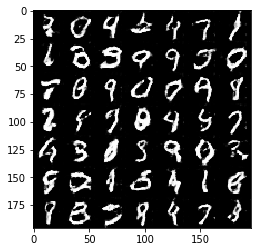

Epoch 2/2... Discriminator Loss: 1.6311... Generator Loss: 0.2918
Epoch 2/2... Discriminator Loss: 0.7550... Generator Loss: 0.9609
Epoch 2/2... Discriminator Loss: 0.8671... Generator Loss: 0.8248
Epoch 2/2... Discriminator Loss: 0.7366... Generator Loss: 0.9301
Epoch 2/2... Discriminator Loss: 0.7024... Generator Loss: 0.9284
Epoch 2/2... Discriminator Loss: 0.7810... Generator Loss: 0.9209
Epoch 2/2... Discriminator Loss: 1.2687... Generator Loss: 0.3987
Epoch 2/2... Discriminator Loss: 0.7799... Generator Loss: 2.2305
Epoch 2/2... Discriminator Loss: 0.9999... Generator Loss: 0.6961
Epoch 2/2... Discriminator Loss: 0.7026... Generator Loss: 0.9023


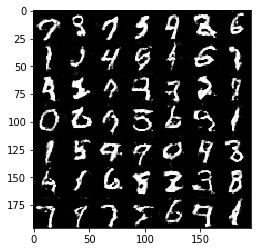

Epoch 2/2... Discriminator Loss: 0.8172... Generator Loss: 2.0616
Epoch 2/2... Discriminator Loss: 1.4868... Generator Loss: 0.4136
Epoch 2/2... Discriminator Loss: 1.5198... Generator Loss: 0.3456
Epoch 2/2... Discriminator Loss: 1.0084... Generator Loss: 0.7153
Epoch 2/2... Discriminator Loss: 0.5574... Generator Loss: 1.2253
Epoch 2/2... Discriminator Loss: 1.5764... Generator Loss: 0.3169
Epoch 2/2... Discriminator Loss: 0.6774... Generator Loss: 1.1318
Epoch 2/2... Discriminator Loss: 0.8422... Generator Loss: 0.7908
Epoch 2/2... Discriminator Loss: 1.4016... Generator Loss: 0.3816
Epoch 2/2... Discriminator Loss: 1.1250... Generator Loss: 0.5363


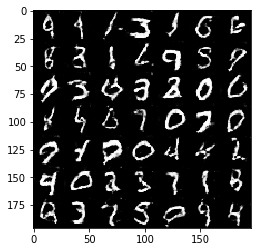

Epoch 2/2... Discriminator Loss: 0.5667... Generator Loss: 2.4066
Epoch 2/2... Discriminator Loss: 0.7213... Generator Loss: 0.9895
Epoch 2/2... Discriminator Loss: 0.6786... Generator Loss: 1.0198
Epoch 2/2... Discriminator Loss: 0.6618... Generator Loss: 1.1360
Epoch 2/2... Discriminator Loss: 0.6351... Generator Loss: 1.0601
Epoch 2/2... Discriminator Loss: 0.9615... Generator Loss: 0.7457
Epoch 2/2... Discriminator Loss: 1.3616... Generator Loss: 0.3838
Epoch 2/2... Discriminator Loss: 1.3566... Generator Loss: 0.4200
Epoch 2/2... Discriminator Loss: 0.6769... Generator Loss: 0.8928
Epoch 2/2... Discriminator Loss: 1.6596... Generator Loss: 0.2828


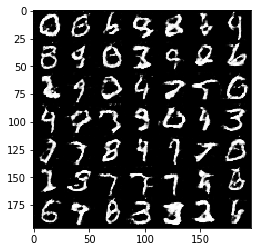

Epoch 2/2... Discriminator Loss: 2.3641... Generator Loss: 0.1627
Epoch 2/2... Discriminator Loss: 0.9595... Generator Loss: 0.8621
Epoch 2/2... Discriminator Loss: 1.0685... Generator Loss: 0.6219
Epoch 2/2... Discriminator Loss: 0.5329... Generator Loss: 2.0802
Epoch 2/2... Discriminator Loss: 1.2433... Generator Loss: 0.4216
Epoch 2/2... Discriminator Loss: 1.3355... Generator Loss: 0.4508
Epoch 2/2... Discriminator Loss: 1.1346... Generator Loss: 0.5080
Epoch 2/2... Discriminator Loss: 1.0723... Generator Loss: 0.5064
Epoch 2/2... Discriminator Loss: 0.8605... Generator Loss: 0.8096
Epoch 2/2... Discriminator Loss: 1.9808... Generator Loss: 0.2862


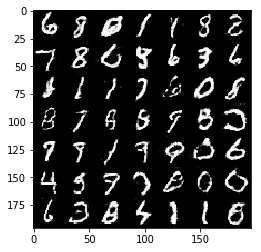

Epoch 2/2... Discriminator Loss: 1.2561... Generator Loss: 0.5452
Epoch 2/2... Discriminator Loss: 0.5769... Generator Loss: 1.1498
Epoch 2/2... Discriminator Loss: 0.6501... Generator Loss: 1.0509
Epoch 2/2... Discriminator Loss: 1.7426... Generator Loss: 0.2803
Epoch 2/2... Discriminator Loss: 1.0014... Generator Loss: 0.6841
Epoch 2/2... Discriminator Loss: 0.7993... Generator Loss: 0.9584
Epoch 2/2... Discriminator Loss: 0.9226... Generator Loss: 0.7638
Epoch 2/2... Discriminator Loss: 0.7292... Generator Loss: 1.0024
Epoch 2/2... Discriminator Loss: 0.5225... Generator Loss: 1.1563
Epoch 2/2... Discriminator Loss: 0.8796... Generator Loss: 0.7135


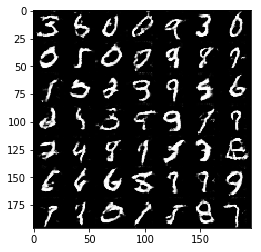

Epoch 2/2... Discriminator Loss: 1.1819... Generator Loss: 0.5205
Epoch 2/2... Discriminator Loss: 0.6894... Generator Loss: 1.1084
Epoch 2/2... Discriminator Loss: 1.1512... Generator Loss: 0.4961
Epoch 2/2... Discriminator Loss: 0.4669... Generator Loss: 1.4438
Epoch 2/2... Discriminator Loss: 0.5170... Generator Loss: 1.2673
Epoch 2/2... Discriminator Loss: 1.1416... Generator Loss: 0.5811
Epoch 2/2... Discriminator Loss: 1.0785... Generator Loss: 0.6902
Epoch 2/2... Discriminator Loss: 0.9544... Generator Loss: 0.7441
Epoch 2/2... Discriminator Loss: 0.9178... Generator Loss: 0.7508
Epoch 2/2... Discriminator Loss: 1.0655... Generator Loss: 0.5778


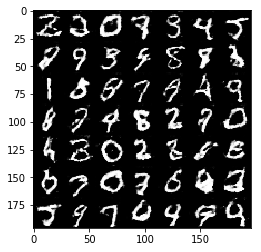

Epoch 2/2... Discriminator Loss: 3.7735... Generator Loss: 6.0944
Epoch 2/2... Discriminator Loss: 0.8613... Generator Loss: 1.3371
Epoch 2/2... Discriminator Loss: 0.5141... Generator Loss: 1.5964
Epoch 2/2... Discriminator Loss: 0.9916... Generator Loss: 0.7031
Epoch 2/2... Discriminator Loss: 1.1601... Generator Loss: 0.4819
Epoch 2/2... Discriminator Loss: 1.9367... Generator Loss: 0.2251
Epoch 2/2... Discriminator Loss: 0.9084... Generator Loss: 0.7374
Epoch 2/2... Discriminator Loss: 0.6576... Generator Loss: 1.2130
Epoch 2/2... Discriminator Loss: 0.7099... Generator Loss: 1.0298
Epoch 2/2... Discriminator Loss: 0.5764... Generator Loss: 1.5311


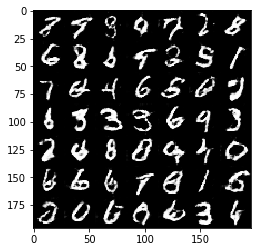

Epoch 2/2... Discriminator Loss: 0.7407... Generator Loss: 0.9398
Epoch 2/2... Discriminator Loss: 1.2908... Generator Loss: 0.5503
Epoch 2/2... Discriminator Loss: 0.6031... Generator Loss: 1.0737
Epoch 2/2... Discriminator Loss: 1.0858... Generator Loss: 0.5373
Epoch 2/2... Discriminator Loss: 0.7957... Generator Loss: 0.8106
Epoch 2/2... Discriminator Loss: 0.7080... Generator Loss: 0.8944
Epoch 2/2... Discriminator Loss: 0.6507... Generator Loss: 0.9844
Epoch 2/2... Discriminator Loss: 0.9354... Generator Loss: 0.7369
Epoch 2/2... Discriminator Loss: 0.7392... Generator Loss: 0.8377
Epoch 2/2... Discriminator Loss: 0.4303... Generator Loss: 1.4357


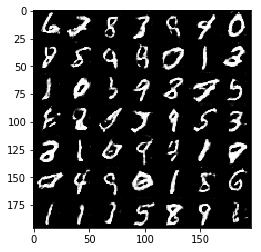

Epoch 2/2... Discriminator Loss: 0.7245... Generator Loss: 2.6394
Epoch 2/2... Discriminator Loss: 0.9366... Generator Loss: 0.7477
Epoch 2/2... Discriminator Loss: 1.0462... Generator Loss: 0.5823
Epoch 2/2... Discriminator Loss: 1.0521... Generator Loss: 0.5940
Epoch 2/2... Discriminator Loss: 1.0275... Generator Loss: 0.6396
Epoch 2/2... Discriminator Loss: 0.4197... Generator Loss: 1.5842
Epoch 2/2... Discriminator Loss: 0.3589... Generator Loss: 1.6584
Epoch 2/2... Discriminator Loss: 0.5260... Generator Loss: 1.2930
Epoch 2/2... Discriminator Loss: 0.8570... Generator Loss: 0.8265
Epoch 2/2... Discriminator Loss: 0.6721... Generator Loss: 1.1201


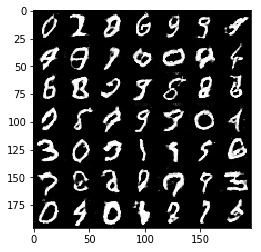

Epoch 2/2... Discriminator Loss: 0.4482... Generator Loss: 1.4642
Epoch 2/2... Discriminator Loss: 1.5950... Generator Loss: 0.4104
Epoch 2/2... Discriminator Loss: 1.1800... Generator Loss: 0.5385
Epoch 2/2... Discriminator Loss: 1.5033... Generator Loss: 0.3653
Epoch 2/2... Discriminator Loss: 1.0472... Generator Loss: 0.6466
Epoch 2/2... Discriminator Loss: 0.5913... Generator Loss: 1.1323
Epoch 2/2... Discriminator Loss: 0.6338... Generator Loss: 1.2891
Epoch 2/2... Discriminator Loss: 0.7858... Generator Loss: 0.8537
Epoch 2/2... Discriminator Loss: 2.4219... Generator Loss: 0.1832
Epoch 2/2... Discriminator Loss: 0.7538... Generator Loss: 1.0882


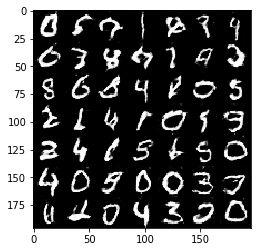

Epoch 2/2... Discriminator Loss: 0.4915... Generator Loss: 1.8572
Epoch 2/2... Discriminator Loss: 1.1612... Generator Loss: 0.5325
Epoch 2/2... Discriminator Loss: 1.5694... Generator Loss: 0.3450
Epoch 2/2... Discriminator Loss: 0.6124... Generator Loss: 1.4200
Epoch 2/2... Discriminator Loss: 0.5483... Generator Loss: 1.3013
Epoch 2/2... Discriminator Loss: 0.9168... Generator Loss: 0.7192
Epoch 2/2... Discriminator Loss: 0.7789... Generator Loss: 0.8114
Epoch 2/2... Discriminator Loss: 0.8852... Generator Loss: 0.8635
Epoch 2/2... Discriminator Loss: 1.7795... Generator Loss: 0.2712
Epoch 2/2... Discriminator Loss: 1.0201... Generator Loss: 0.6445


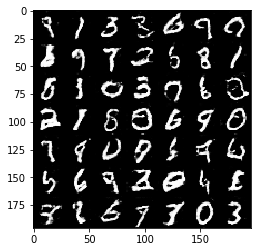

Epoch 2/2... Discriminator Loss: 0.6256... Generator Loss: 1.0472
Epoch 2/2... Discriminator Loss: 0.5215... Generator Loss: 1.1451
Epoch 2/2... Discriminator Loss: 0.5132... Generator Loss: 1.7778
Epoch 2/2... Discriminator Loss: 0.7163... Generator Loss: 1.0024
Epoch 2/2... Discriminator Loss: 0.8757... Generator Loss: 0.7515
Epoch 2/2... Discriminator Loss: 0.5020... Generator Loss: 1.1408
Epoch 2/2... Discriminator Loss: 1.0950... Generator Loss: 0.6102
Epoch 2/2... Discriminator Loss: 0.7193... Generator Loss: 0.7917
Epoch 2/2... Discriminator Loss: 0.4702... Generator Loss: 1.2760
Epoch 2/2... Discriminator Loss: 1.1725... Generator Loss: 0.4889


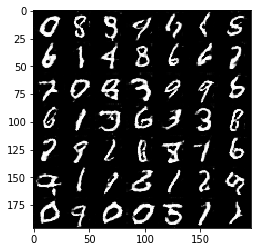

Epoch 2/2... Discriminator Loss: 1.6983... Generator Loss: 4.6308
Epoch 2/2... Discriminator Loss: 0.5233... Generator Loss: 1.7511
Epoch 2/2... Discriminator Loss: 0.9725... Generator Loss: 0.6607
Epoch 2/2... Discriminator Loss: 0.7316... Generator Loss: 0.8936
Epoch 2/2... Discriminator Loss: 0.6729... Generator Loss: 0.9984
Epoch 2/2... Discriminator Loss: 0.9125... Generator Loss: 0.7347
Epoch 2/2... Discriminator Loss: 0.5911... Generator Loss: 1.2511
Epoch 2/2... Discriminator Loss: 0.6531... Generator Loss: 0.9174
Epoch 2/2... Discriminator Loss: 1.0286... Generator Loss: 3.8263
Epoch 2/2... Discriminator Loss: 1.2404... Generator Loss: 0.4820


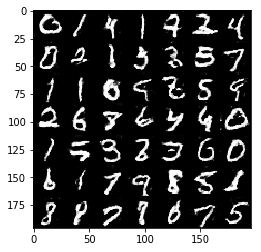

Epoch 2/2... Discriminator Loss: 0.8687... Generator Loss: 0.9764
Epoch 2/2... Discriminator Loss: 2.7319... Generator Loss: 0.1131
Epoch 2/2... Discriminator Loss: 1.3364... Generator Loss: 0.4237
Epoch 2/2... Discriminator Loss: 0.6280... Generator Loss: 1.0383
Epoch 2/2... Discriminator Loss: 0.5920... Generator Loss: 1.0563
Epoch 2/2... Discriminator Loss: 0.6678... Generator Loss: 0.9901
Epoch 2/2... Discriminator Loss: 0.9546... Generator Loss: 0.6532
Epoch 2/2... Discriminator Loss: 0.4267... Generator Loss: 1.3817
Epoch 2/2... Discriminator Loss: 1.8482... Generator Loss: 4.3352
Epoch 2/2... Discriminator Loss: 0.8721... Generator Loss: 0.8609


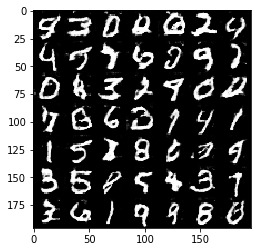

Epoch 2/2... Discriminator Loss: 0.3563... Generator Loss: 1.7067
Epoch 2/2... Discriminator Loss: 1.0377... Generator Loss: 3.1596
Epoch 2/2... Discriminator Loss: 0.6672... Generator Loss: 0.9412
Epoch 2/2... Discriminator Loss: 1.5406... Generator Loss: 0.3489
Epoch 2/2... Discriminator Loss: 0.6812... Generator Loss: 0.9169
Epoch 2/2... Discriminator Loss: 0.6225... Generator Loss: 1.1770
Epoch 2/2... Discriminator Loss: 0.6578... Generator Loss: 0.9461
Epoch 2/2... Discriminator Loss: 0.7288... Generator Loss: 0.9067
Epoch 2/2... Discriminator Loss: 1.1975... Generator Loss: 0.4930
Epoch 2/2... Discriminator Loss: 1.3011... Generator Loss: 3.4539


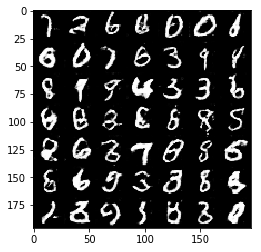

Epoch 2/2... Discriminator Loss: 0.2543... Generator Loss: 2.3353
Epoch 2/2... Discriminator Loss: 0.5097... Generator Loss: 1.2609
Epoch 2/2... Discriminator Loss: 0.7724... Generator Loss: 0.8064
Epoch 2/2... Discriminator Loss: 0.8469... Generator Loss: 0.7903
Epoch 2/2... Discriminator Loss: 0.6569... Generator Loss: 0.9752


In [89]:
batch_size = 32
z_dim = 200
learning_rate = 0.0002
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))

with tf.Graph().as_default():
    losses = train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
                   mnist_dataset.shape, mnist_dataset.image_mode)

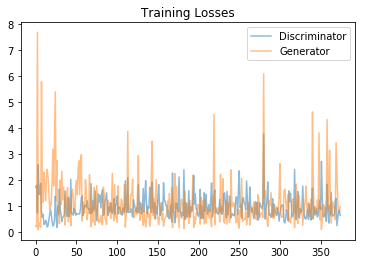

In [90]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Discriminator Loss: 1.9187... Generator Loss: 0.2403
Epoch 1/2... Discriminator Loss: 1.2808... Generator Loss: 0.5910
Epoch 1/2... Discriminator Loss: 1.0042... Generator Loss: 0.7550
Epoch 1/2... Discriminator Loss: 0.4366... Generator Loss: 1.7896
Epoch 1/2... Discriminator Loss: 0.2148... Generator Loss: 2.9517
Epoch 1/2... Discriminator Loss: 0.3544... Generator Loss: 1.5455
Epoch 1/2... Discriminator Loss: 0.3177... Generator Loss: 1.6965
Epoch 1/2... Discriminator Loss: 0.2672... Generator Loss: 1.9945
Epoch 1/2... Discriminator Loss: 0.1877... Generator Loss: 2.4645
Epoch 1/2... Discriminator Loss: 0.3108... Generator Loss: 2.2524


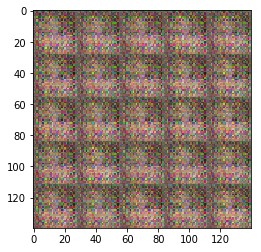

Epoch 1/2... Discriminator Loss: 0.2236... Generator Loss: 4.7603
Epoch 1/2... Discriminator Loss: 0.3464... Generator Loss: 1.4827
Epoch 1/2... Discriminator Loss: 0.2566... Generator Loss: 2.9284
Epoch 1/2... Discriminator Loss: 0.1245... Generator Loss: 6.0057
Epoch 1/2... Discriminator Loss: 0.5158... Generator Loss: 1.4901
Epoch 1/2... Discriminator Loss: 0.2367... Generator Loss: 2.9860
Epoch 1/2... Discriminator Loss: 0.2701... Generator Loss: 5.9074
Epoch 1/2... Discriminator Loss: 0.1374... Generator Loss: 4.7198
Epoch 1/2... Discriminator Loss: 0.2421... Generator Loss: 2.2532
Epoch 1/2... Discriminator Loss: 0.2381... Generator Loss: 2.4942


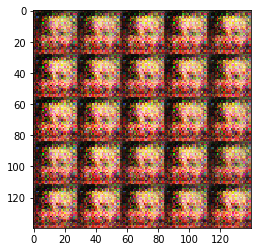

Epoch 1/2... Discriminator Loss: 0.1884... Generator Loss: 2.3915
Epoch 1/2... Discriminator Loss: 0.1893... Generator Loss: 2.3728
Epoch 1/2... Discriminator Loss: 0.1713... Generator Loss: 2.4391
Epoch 1/2... Discriminator Loss: 0.2268... Generator Loss: 2.0420
Epoch 1/2... Discriminator Loss: 0.1847... Generator Loss: 2.3169
Epoch 1/2... Discriminator Loss: 0.0952... Generator Loss: 2.9739
Epoch 1/2... Discriminator Loss: 0.1393... Generator Loss: 2.7698
Epoch 1/2... Discriminator Loss: 0.1295... Generator Loss: 2.8096
Epoch 1/2... Discriminator Loss: 0.0466... Generator Loss: 3.2361
Epoch 1/2... Discriminator Loss: 0.0666... Generator Loss: 3.2456


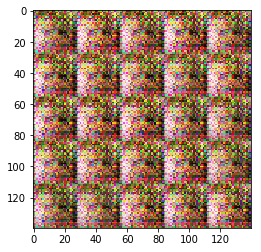

Epoch 1/2... Discriminator Loss: 0.1844... Generator Loss: 2.7018
Epoch 1/2... Discriminator Loss: 0.1165... Generator Loss: 4.1405
Epoch 1/2... Discriminator Loss: 0.1382... Generator Loss: 2.6111
Epoch 1/2... Discriminator Loss: 0.1482... Generator Loss: 2.3818
Epoch 1/2... Discriminator Loss: 0.1178... Generator Loss: 2.5930
Epoch 1/2... Discriminator Loss: 0.1237... Generator Loss: 3.6282
Epoch 1/2... Discriminator Loss: 0.3975... Generator Loss: 2.6143
Epoch 1/2... Discriminator Loss: 0.7638... Generator Loss: 0.7863
Epoch 1/2... Discriminator Loss: 0.8306... Generator Loss: 2.5617
Epoch 1/2... Discriminator Loss: 0.6813... Generator Loss: 2.2641


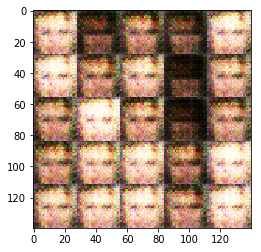

Epoch 1/2... Discriminator Loss: 0.2959... Generator Loss: 3.7372
Epoch 1/2... Discriminator Loss: 0.7802... Generator Loss: 2.4659
Epoch 1/2... Discriminator Loss: 1.3553... Generator Loss: 0.3716
Epoch 1/2... Discriminator Loss: 0.5214... Generator Loss: 3.9565
Epoch 1/2... Discriminator Loss: 0.3051... Generator Loss: 1.9684
Epoch 1/2... Discriminator Loss: 1.1160... Generator Loss: 0.6954
Epoch 1/2... Discriminator Loss: 0.4281... Generator Loss: 2.1589
Epoch 1/2... Discriminator Loss: 0.5148... Generator Loss: 1.4554
Epoch 1/2... Discriminator Loss: 0.6398... Generator Loss: 1.0158
Epoch 1/2... Discriminator Loss: 0.3286... Generator Loss: 3.7909


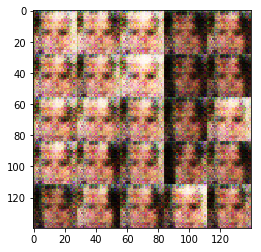

Epoch 1/2... Discriminator Loss: 0.7707... Generator Loss: 1.4233
Epoch 1/2... Discriminator Loss: 0.4543... Generator Loss: 2.0115
Epoch 1/2... Discriminator Loss: 0.4949... Generator Loss: 1.7550
Epoch 1/2... Discriminator Loss: 0.6373... Generator Loss: 0.9514
Epoch 1/2... Discriminator Loss: 0.3789... Generator Loss: 1.9771
Epoch 1/2... Discriminator Loss: 0.6859... Generator Loss: 1.3406
Epoch 1/2... Discriminator Loss: 0.5476... Generator Loss: 1.3183
Epoch 1/2... Discriminator Loss: 0.5517... Generator Loss: 1.3983
Epoch 1/2... Discriminator Loss: 0.4379... Generator Loss: 3.2237
Epoch 1/2... Discriminator Loss: 0.8688... Generator Loss: 1.4443


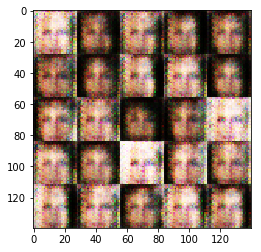

Epoch 1/2... Discriminator Loss: 1.1112... Generator Loss: 0.5303
Epoch 1/2... Discriminator Loss: 0.6550... Generator Loss: 3.7990
Epoch 1/2... Discriminator Loss: 0.6016... Generator Loss: 1.2328
Epoch 1/2... Discriminator Loss: 0.6397... Generator Loss: 1.1289
Epoch 1/2... Discriminator Loss: 0.5655... Generator Loss: 1.9377
Epoch 1/2... Discriminator Loss: 0.7303... Generator Loss: 1.0871
Epoch 1/2... Discriminator Loss: 0.6657... Generator Loss: 1.3014
Epoch 1/2... Discriminator Loss: 0.5074... Generator Loss: 2.0279
Epoch 1/2... Discriminator Loss: 0.5670... Generator Loss: 1.7434
Epoch 1/2... Discriminator Loss: 0.5345... Generator Loss: 1.3285


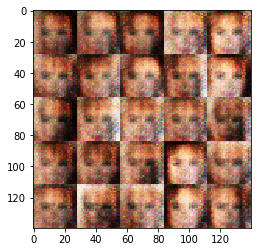

Epoch 1/2... Discriminator Loss: 0.6957... Generator Loss: 3.1306
Epoch 1/2... Discriminator Loss: 0.4553... Generator Loss: 1.6983
Epoch 1/2... Discriminator Loss: 0.6301... Generator Loss: 1.7473
Epoch 1/2... Discriminator Loss: 0.9079... Generator Loss: 0.7532
Epoch 1/2... Discriminator Loss: 0.8116... Generator Loss: 0.8763
Epoch 1/2... Discriminator Loss: 0.6157... Generator Loss: 1.3658
Epoch 1/2... Discriminator Loss: 0.7193... Generator Loss: 1.5908
Epoch 1/2... Discriminator Loss: 0.7173... Generator Loss: 2.8658
Epoch 1/2... Discriminator Loss: 0.9571... Generator Loss: 1.6204
Epoch 1/2... Discriminator Loss: 0.7913... Generator Loss: 1.6967


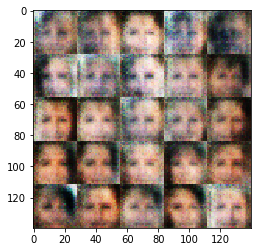

Epoch 1/2... Discriminator Loss: 0.6464... Generator Loss: 1.3091
Epoch 1/2... Discriminator Loss: 0.6373... Generator Loss: 1.8777
Epoch 1/2... Discriminator Loss: 0.6737... Generator Loss: 1.1627
Epoch 1/2... Discriminator Loss: 0.8105... Generator Loss: 1.2710
Epoch 1/2... Discriminator Loss: 1.0135... Generator Loss: 0.7806
Epoch 1/2... Discriminator Loss: 0.6409... Generator Loss: 1.8957
Epoch 1/2... Discriminator Loss: 0.7900... Generator Loss: 1.3180
Epoch 1/2... Discriminator Loss: 0.7681... Generator Loss: 1.3844
Epoch 1/2... Discriminator Loss: 1.0025... Generator Loss: 0.7670
Epoch 1/2... Discriminator Loss: 1.5763... Generator Loss: 0.3318


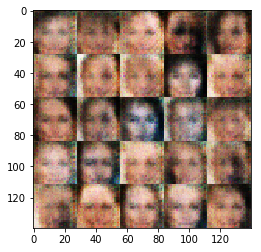

Epoch 1/2... Discriminator Loss: 0.7414... Generator Loss: 1.0902
Epoch 1/2... Discriminator Loss: 0.9455... Generator Loss: 1.6022
Epoch 1/2... Discriminator Loss: 0.9380... Generator Loss: 2.2628
Epoch 1/2... Discriminator Loss: 0.9606... Generator Loss: 0.8694
Epoch 1/2... Discriminator Loss: 0.6720... Generator Loss: 1.2330
Epoch 1/2... Discriminator Loss: 0.9808... Generator Loss: 1.1711
Epoch 1/2... Discriminator Loss: 0.7353... Generator Loss: 1.1306
Epoch 1/2... Discriminator Loss: 0.7494... Generator Loss: 1.2319
Epoch 1/2... Discriminator Loss: 0.5990... Generator Loss: 1.2989
Epoch 1/2... Discriminator Loss: 0.6330... Generator Loss: 1.0335


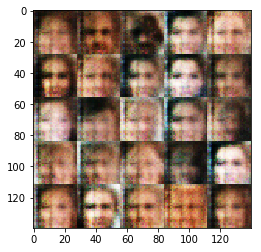

Epoch 1/2... Discriminator Loss: 0.9385... Generator Loss: 0.8918
Epoch 1/2... Discriminator Loss: 1.1810... Generator Loss: 0.5966
Epoch 1/2... Discriminator Loss: 0.5290... Generator Loss: 1.6747
Epoch 1/2... Discriminator Loss: 0.9688... Generator Loss: 0.8396
Epoch 1/2... Discriminator Loss: 0.7662... Generator Loss: 1.2222
Epoch 1/2... Discriminator Loss: 1.3403... Generator Loss: 1.6912
Epoch 1/2... Discriminator Loss: 0.9645... Generator Loss: 2.3009
Epoch 1/2... Discriminator Loss: 1.1191... Generator Loss: 0.7049
Epoch 1/2... Discriminator Loss: 1.2468... Generator Loss: 0.7680
Epoch 1/2... Discriminator Loss: 0.9007... Generator Loss: 1.3511


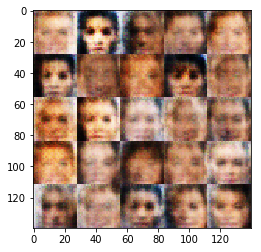

Epoch 1/2... Discriminator Loss: 0.9616... Generator Loss: 0.8121
Epoch 1/2... Discriminator Loss: 0.7237... Generator Loss: 1.2260
Epoch 1/2... Discriminator Loss: 1.0704... Generator Loss: 0.6292
Epoch 1/2... Discriminator Loss: 1.3679... Generator Loss: 0.5771
Epoch 1/2... Discriminator Loss: 1.0166... Generator Loss: 1.1258
Epoch 1/2... Discriminator Loss: 1.4643... Generator Loss: 1.4685
Epoch 1/2... Discriminator Loss: 0.9019... Generator Loss: 0.8712
Epoch 1/2... Discriminator Loss: 0.8541... Generator Loss: 1.3928
Epoch 1/2... Discriminator Loss: 1.1498... Generator Loss: 0.7872
Epoch 1/2... Discriminator Loss: 1.2165... Generator Loss: 0.8898


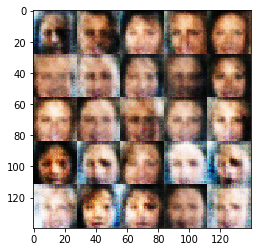

Epoch 1/2... Discriminator Loss: 1.1095... Generator Loss: 0.7044
Epoch 1/2... Discriminator Loss: 1.0320... Generator Loss: 0.9067
Epoch 1/2... Discriminator Loss: 1.0352... Generator Loss: 0.8291
Epoch 1/2... Discriminator Loss: 1.0164... Generator Loss: 0.7288
Epoch 1/2... Discriminator Loss: 1.1728... Generator Loss: 0.6438
Epoch 1/2... Discriminator Loss: 1.0844... Generator Loss: 0.6508
Epoch 1/2... Discriminator Loss: 0.9453... Generator Loss: 1.0455
Epoch 1/2... Discriminator Loss: 1.3112... Generator Loss: 0.6432
Epoch 1/2... Discriminator Loss: 1.0830... Generator Loss: 0.6295
Epoch 1/2... Discriminator Loss: 0.8810... Generator Loss: 1.2968


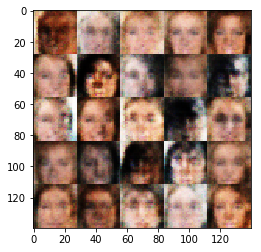

Epoch 1/2... Discriminator Loss: 0.9854... Generator Loss: 0.8913
Epoch 1/2... Discriminator Loss: 0.8606... Generator Loss: 1.1231
Epoch 1/2... Discriminator Loss: 1.1111... Generator Loss: 0.6876
Epoch 1/2... Discriminator Loss: 1.4474... Generator Loss: 0.3691
Epoch 1/2... Discriminator Loss: 1.0049... Generator Loss: 0.9126
Epoch 1/2... Discriminator Loss: 0.8888... Generator Loss: 1.4023
Epoch 1/2... Discriminator Loss: 0.9380... Generator Loss: 1.2002
Epoch 1/2... Discriminator Loss: 0.9311... Generator Loss: 0.9437
Epoch 1/2... Discriminator Loss: 0.9905... Generator Loss: 1.3881
Epoch 1/2... Discriminator Loss: 0.8250... Generator Loss: 1.1772


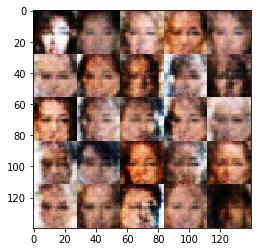

Epoch 1/2... Discriminator Loss: 1.1048... Generator Loss: 1.1308
Epoch 1/2... Discriminator Loss: 1.0112... Generator Loss: 0.7613
Epoch 1/2... Discriminator Loss: 1.1071... Generator Loss: 0.8101
Epoch 1/2... Discriminator Loss: 0.9852... Generator Loss: 0.8084
Epoch 1/2... Discriminator Loss: 1.0237... Generator Loss: 0.8686
Epoch 1/2... Discriminator Loss: 1.0518... Generator Loss: 0.8064
Epoch 1/2... Discriminator Loss: 1.0836... Generator Loss: 0.7478
Epoch 1/2... Discriminator Loss: 0.7232... Generator Loss: 1.1502
Epoch 1/2... Discriminator Loss: 1.1654... Generator Loss: 0.5625
Epoch 1/2... Discriminator Loss: 1.0563... Generator Loss: 0.7881


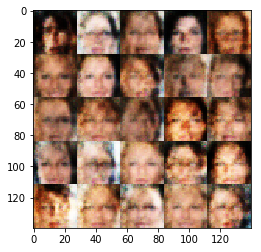

Epoch 1/2... Discriminator Loss: 1.2415... Generator Loss: 0.7026
Epoch 1/2... Discriminator Loss: 1.0299... Generator Loss: 0.6260
Epoch 1/2... Discriminator Loss: 1.1423... Generator Loss: 0.7097
Epoch 1/2... Discriminator Loss: 0.9229... Generator Loss: 0.8836
Epoch 1/2... Discriminator Loss: 0.8960... Generator Loss: 0.9121
Epoch 1/2... Discriminator Loss: 1.0626... Generator Loss: 0.7025
Epoch 1/2... Discriminator Loss: 0.9090... Generator Loss: 0.8161
Epoch 1/2... Discriminator Loss: 1.1165... Generator Loss: 0.6078
Epoch 1/2... Discriminator Loss: 0.9311... Generator Loss: 0.8060
Epoch 1/2... Discriminator Loss: 1.1999... Generator Loss: 0.6057


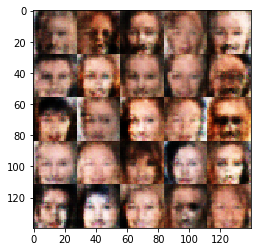

Epoch 1/2... Discriminator Loss: 1.0419... Generator Loss: 0.7721
Epoch 1/2... Discriminator Loss: 0.9120... Generator Loss: 0.8530
Epoch 1/2... Discriminator Loss: 1.1401... Generator Loss: 0.7866
Epoch 1/2... Discriminator Loss: 0.9990... Generator Loss: 1.4630
Epoch 1/2... Discriminator Loss: 0.9181... Generator Loss: 0.7977
Epoch 1/2... Discriminator Loss: 1.1611... Generator Loss: 0.9523
Epoch 1/2... Discriminator Loss: 0.7847... Generator Loss: 1.5449
Epoch 1/2... Discriminator Loss: 1.4183... Generator Loss: 0.4532
Epoch 1/2... Discriminator Loss: 1.0652... Generator Loss: 0.9447
Epoch 1/2... Discriminator Loss: 0.9724... Generator Loss: 0.8171


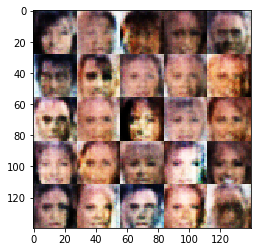

Epoch 1/2... Discriminator Loss: 0.9713... Generator Loss: 0.9740
Epoch 1/2... Discriminator Loss: 1.0675... Generator Loss: 0.7523
Epoch 1/2... Discriminator Loss: 0.8604... Generator Loss: 1.3891
Epoch 1/2... Discriminator Loss: 1.1246... Generator Loss: 0.6018
Epoch 1/2... Discriminator Loss: 0.9601... Generator Loss: 0.8427
Epoch 1/2... Discriminator Loss: 0.7546... Generator Loss: 0.9858
Epoch 1/2... Discriminator Loss: 1.1236... Generator Loss: 0.5784
Epoch 1/2... Discriminator Loss: 1.2518... Generator Loss: 1.1388
Epoch 1/2... Discriminator Loss: 1.0908... Generator Loss: 0.6231
Epoch 1/2... Discriminator Loss: 0.7522... Generator Loss: 1.2123


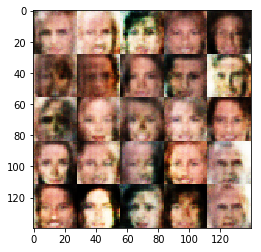

Epoch 1/2... Discriminator Loss: 0.8386... Generator Loss: 1.0060
Epoch 1/2... Discriminator Loss: 1.0133... Generator Loss: 0.8485
Epoch 1/2... Discriminator Loss: 0.9942... Generator Loss: 0.9279
Epoch 1/2... Discriminator Loss: 0.9234... Generator Loss: 1.1846
Epoch 1/2... Discriminator Loss: 0.8747... Generator Loss: 1.2795
Epoch 1/2... Discriminator Loss: 0.8948... Generator Loss: 0.7647
Epoch 1/2... Discriminator Loss: 1.1134... Generator Loss: 0.5367
Epoch 1/2... Discriminator Loss: 0.8709... Generator Loss: 1.2250
Epoch 1/2... Discriminator Loss: 1.2449... Generator Loss: 0.5258
Epoch 1/2... Discriminator Loss: 0.9287... Generator Loss: 0.9902


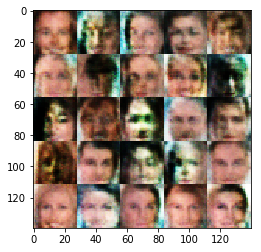

Epoch 1/2... Discriminator Loss: 1.2162... Generator Loss: 1.9305
Epoch 1/2... Discriminator Loss: 1.2995... Generator Loss: 0.4909
Epoch 1/2... Discriminator Loss: 1.0310... Generator Loss: 0.6489
Epoch 1/2... Discriminator Loss: 1.0135... Generator Loss: 1.0136
Epoch 1/2... Discriminator Loss: 0.8796... Generator Loss: 0.7745
Epoch 1/2... Discriminator Loss: 0.9398... Generator Loss: 1.4386
Epoch 1/2... Discriminator Loss: 0.9894... Generator Loss: 0.7130
Epoch 1/2... Discriminator Loss: 1.1947... Generator Loss: 0.7312
Epoch 1/2... Discriminator Loss: 0.9841... Generator Loss: 0.8867
Epoch 1/2... Discriminator Loss: 0.9362... Generator Loss: 1.4263


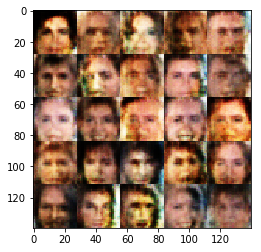

Epoch 1/2... Discriminator Loss: 0.9375... Generator Loss: 0.9863
Epoch 1/2... Discriminator Loss: 1.1801... Generator Loss: 0.6227
Epoch 1/2... Discriminator Loss: 1.2102... Generator Loss: 0.4981
Epoch 1/2... Discriminator Loss: 0.9471... Generator Loss: 0.9964
Epoch 1/2... Discriminator Loss: 1.0272... Generator Loss: 0.7533
Epoch 1/2... Discriminator Loss: 1.1445... Generator Loss: 0.5872
Epoch 1/2... Discriminator Loss: 1.0151... Generator Loss: 0.7608
Epoch 1/2... Discriminator Loss: 0.8330... Generator Loss: 1.1387
Epoch 1/2... Discriminator Loss: 0.9605... Generator Loss: 0.7892
Epoch 1/2... Discriminator Loss: 0.9361... Generator Loss: 0.8069


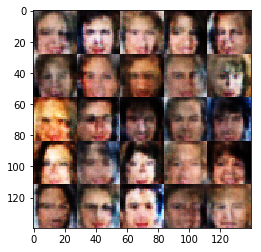

Epoch 1/2... Discriminator Loss: 0.8019... Generator Loss: 0.9520
Epoch 1/2... Discriminator Loss: 0.9988... Generator Loss: 1.2343
Epoch 1/2... Discriminator Loss: 0.7842... Generator Loss: 1.0669
Epoch 1/2... Discriminator Loss: 0.9831... Generator Loss: 0.7743
Epoch 1/2... Discriminator Loss: 1.0261... Generator Loss: 0.6267
Epoch 1/2... Discriminator Loss: 1.2322... Generator Loss: 0.6065
Epoch 1/2... Discriminator Loss: 1.0646... Generator Loss: 0.6666
Epoch 1/2... Discriminator Loss: 0.9468... Generator Loss: 1.0666
Epoch 1/2... Discriminator Loss: 1.2665... Generator Loss: 0.4376
Epoch 1/2... Discriminator Loss: 1.1907... Generator Loss: 0.5519


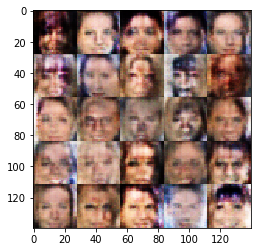

Epoch 1/2... Discriminator Loss: 1.1015... Generator Loss: 0.8621
Epoch 1/2... Discriminator Loss: 1.0716... Generator Loss: 1.2621
Epoch 1/2... Discriminator Loss: 1.0184... Generator Loss: 0.8610
Epoch 1/2... Discriminator Loss: 1.0745... Generator Loss: 0.6318
Epoch 1/2... Discriminator Loss: 1.2893... Generator Loss: 0.4552
Epoch 1/2... Discriminator Loss: 0.9464... Generator Loss: 0.7955
Epoch 1/2... Discriminator Loss: 1.1487... Generator Loss: 0.8680
Epoch 1/2... Discriminator Loss: 0.9948... Generator Loss: 1.0507
Epoch 1/2... Discriminator Loss: 1.0295... Generator Loss: 0.6420
Epoch 1/2... Discriminator Loss: 1.0295... Generator Loss: 0.8083


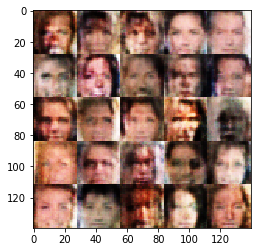

Epoch 1/2... Discriminator Loss: 1.1905... Generator Loss: 0.6029
Epoch 1/2... Discriminator Loss: 0.9643... Generator Loss: 0.7932
Epoch 1/2... Discriminator Loss: 0.7758... Generator Loss: 1.0930
Epoch 1/2... Discriminator Loss: 0.9586... Generator Loss: 0.8494
Epoch 1/2... Discriminator Loss: 1.2382... Generator Loss: 0.4916
Epoch 1/2... Discriminator Loss: 1.2346... Generator Loss: 0.5752
Epoch 1/2... Discriminator Loss: 1.2655... Generator Loss: 1.3349
Epoch 1/2... Discriminator Loss: 0.9973... Generator Loss: 0.7238
Epoch 1/2... Discriminator Loss: 1.1209... Generator Loss: 1.5090
Epoch 1/2... Discriminator Loss: 0.9447... Generator Loss: 0.7851


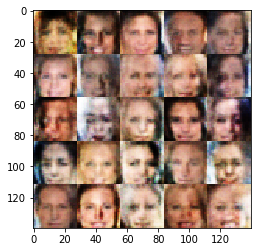

Epoch 1/2... Discriminator Loss: 1.0460... Generator Loss: 0.7416
Epoch 1/2... Discriminator Loss: 1.4037... Generator Loss: 0.3786
Epoch 1/2... Discriminator Loss: 1.0304... Generator Loss: 0.9643
Epoch 1/2... Discriminator Loss: 1.3564... Generator Loss: 0.3930
Epoch 1/2... Discriminator Loss: 0.9718... Generator Loss: 1.1554
Epoch 1/2... Discriminator Loss: 1.3699... Generator Loss: 0.4421
Epoch 1/2... Discriminator Loss: 1.0277... Generator Loss: 0.7800
Epoch 1/2... Discriminator Loss: 0.9943... Generator Loss: 0.8756
Epoch 1/2... Discriminator Loss: 1.1969... Generator Loss: 0.4766
Epoch 1/2... Discriminator Loss: 1.0298... Generator Loss: 0.9107


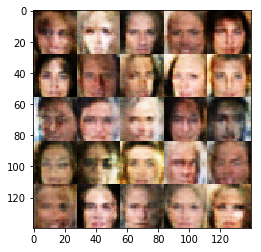

Epoch 1/2... Discriminator Loss: 0.8952... Generator Loss: 0.7363
Epoch 1/2... Discriminator Loss: 0.9941... Generator Loss: 1.0545
Epoch 1/2... Discriminator Loss: 0.9920... Generator Loss: 0.9967
Epoch 1/2... Discriminator Loss: 1.0626... Generator Loss: 1.0282
Epoch 1/2... Discriminator Loss: 0.9612... Generator Loss: 0.8605
Epoch 1/2... Discriminator Loss: 1.0529... Generator Loss: 1.0117
Epoch 1/2... Discriminator Loss: 1.1903... Generator Loss: 0.5619
Epoch 1/2... Discriminator Loss: 1.1055... Generator Loss: 0.9192
Epoch 1/2... Discriminator Loss: 1.0901... Generator Loss: 0.7036
Epoch 1/2... Discriminator Loss: 1.0589... Generator Loss: 1.1064


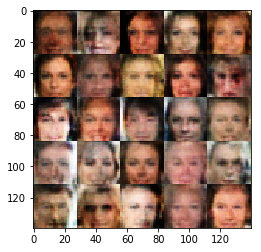

Epoch 1/2... Discriminator Loss: 1.0483... Generator Loss: 0.7165
Epoch 1/2... Discriminator Loss: 1.0956... Generator Loss: 0.6633
Epoch 1/2... Discriminator Loss: 0.9706... Generator Loss: 1.5346
Epoch 1/2... Discriminator Loss: 0.9700... Generator Loss: 0.9781
Epoch 1/2... Discriminator Loss: 1.0579... Generator Loss: 1.2120
Epoch 1/2... Discriminator Loss: 1.1362... Generator Loss: 0.7177
Epoch 1/2... Discriminator Loss: 0.9897... Generator Loss: 0.8175
Epoch 1/2... Discriminator Loss: 1.1716... Generator Loss: 0.4956
Epoch 1/2... Discriminator Loss: 0.9622... Generator Loss: 0.7204
Epoch 1/2... Discriminator Loss: 1.1194... Generator Loss: 0.6721


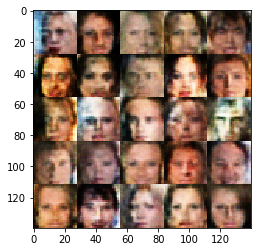

Epoch 1/2... Discriminator Loss: 0.7554... Generator Loss: 1.3648
Epoch 1/2... Discriminator Loss: 1.0536... Generator Loss: 0.6878
Epoch 1/2... Discriminator Loss: 1.1463... Generator Loss: 0.6873
Epoch 1/2... Discriminator Loss: 1.0207... Generator Loss: 0.7568
Epoch 1/2... Discriminator Loss: 1.1364... Generator Loss: 0.5967
Epoch 1/2... Discriminator Loss: 1.1855... Generator Loss: 0.4859
Epoch 1/2... Discriminator Loss: 1.1344... Generator Loss: 0.9635
Epoch 1/2... Discriminator Loss: 0.7778... Generator Loss: 0.9809
Epoch 1/2... Discriminator Loss: 0.8968... Generator Loss: 1.0282
Epoch 1/2... Discriminator Loss: 0.9944... Generator Loss: 0.8130


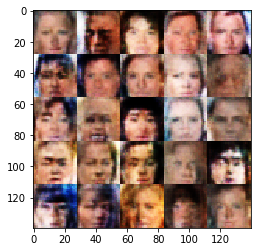

Epoch 1/2... Discriminator Loss: 0.8804... Generator Loss: 0.9473
Epoch 1/2... Discriminator Loss: 0.9874... Generator Loss: 1.3409
Epoch 1/2... Discriminator Loss: 1.1304... Generator Loss: 1.3940
Epoch 1/2... Discriminator Loss: 1.1150... Generator Loss: 0.7334
Epoch 1/2... Discriminator Loss: 1.1852... Generator Loss: 0.7120
Epoch 1/2... Discriminator Loss: 0.8192... Generator Loss: 1.0784
Epoch 1/2... Discriminator Loss: 0.9995... Generator Loss: 1.2414
Epoch 1/2... Discriminator Loss: 1.2687... Generator Loss: 0.4671
Epoch 1/2... Discriminator Loss: 1.0248... Generator Loss: 0.8415
Epoch 1/2... Discriminator Loss: 0.8540... Generator Loss: 1.2516


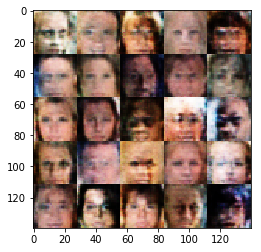

Epoch 1/2... Discriminator Loss: 1.2280... Generator Loss: 0.6004
Epoch 1/2... Discriminator Loss: 1.0947... Generator Loss: 0.6135
Epoch 1/2... Discriminator Loss: 1.1229... Generator Loss: 0.7090
Epoch 1/2... Discriminator Loss: 0.9320... Generator Loss: 1.0308
Epoch 1/2... Discriminator Loss: 0.7481... Generator Loss: 1.1161
Epoch 1/2... Discriminator Loss: 1.0933... Generator Loss: 0.7010
Epoch 1/2... Discriminator Loss: 1.0540... Generator Loss: 1.2178
Epoch 1/2... Discriminator Loss: 0.8387... Generator Loss: 1.1877
Epoch 1/2... Discriminator Loss: 0.8684... Generator Loss: 0.8220
Epoch 1/2... Discriminator Loss: 0.8987... Generator Loss: 0.9188


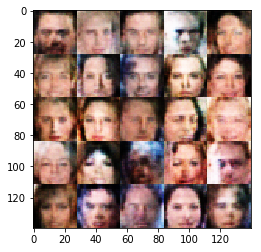

Epoch 1/2... Discriminator Loss: 1.0680... Generator Loss: 0.6150
Epoch 1/2... Discriminator Loss: 0.8876... Generator Loss: 0.7916
Epoch 1/2... Discriminator Loss: 1.3527... Generator Loss: 0.4111
Epoch 1/2... Discriminator Loss: 0.9486... Generator Loss: 0.7563
Epoch 1/2... Discriminator Loss: 0.9208... Generator Loss: 0.7540
Epoch 1/2... Discriminator Loss: 1.0614... Generator Loss: 0.7276
Epoch 1/2... Discriminator Loss: 1.5572... Generator Loss: 0.4291
Epoch 1/2... Discriminator Loss: 1.0205... Generator Loss: 0.6557
Epoch 1/2... Discriminator Loss: 1.1867... Generator Loss: 0.5012
Epoch 1/2... Discriminator Loss: 1.1626... Generator Loss: 0.8340


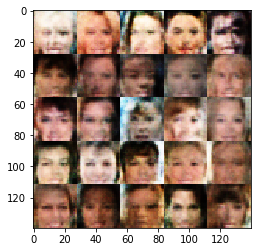

Epoch 1/2... Discriminator Loss: 1.7060... Generator Loss: 0.2878
Epoch 1/2... Discriminator Loss: 0.9774... Generator Loss: 0.7563
Epoch 1/2... Discriminator Loss: 1.1321... Generator Loss: 0.8496
Epoch 1/2... Discriminator Loss: 1.1251... Generator Loss: 0.6542
Epoch 1/2... Discriminator Loss: 1.0332... Generator Loss: 0.7909
Epoch 1/2... Discriminator Loss: 0.7928... Generator Loss: 1.0681
Epoch 1/2... Discriminator Loss: 1.1124... Generator Loss: 0.6093
Epoch 1/2... Discriminator Loss: 1.2546... Generator Loss: 0.5130
Epoch 1/2... Discriminator Loss: 1.2684... Generator Loss: 0.4719
Epoch 1/2... Discriminator Loss: 1.6474... Generator Loss: 0.2940


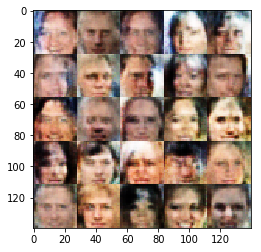

Epoch 1/2... Discriminator Loss: 0.9837... Generator Loss: 0.9928
Epoch 1/2... Discriminator Loss: 0.9493... Generator Loss: 0.8281
Epoch 1/2... Discriminator Loss: 1.0573... Generator Loss: 0.6209
Epoch 1/2... Discriminator Loss: 0.9527... Generator Loss: 0.7895
Epoch 1/2... Discriminator Loss: 1.0406... Generator Loss: 0.6353
Epoch 1/2... Discriminator Loss: 1.0618... Generator Loss: 0.7261
Epoch 1/2... Discriminator Loss: 1.3122... Generator Loss: 0.6021
Epoch 1/2... Discriminator Loss: 1.0312... Generator Loss: 0.8226
Epoch 1/2... Discriminator Loss: 1.2615... Generator Loss: 0.7379
Epoch 1/2... Discriminator Loss: 0.9630... Generator Loss: 1.0204


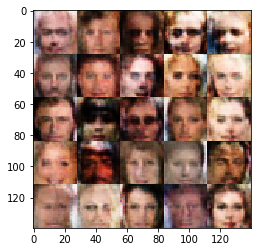

Epoch 1/2... Discriminator Loss: 0.7878... Generator Loss: 0.9958
Epoch 1/2... Discriminator Loss: 1.2960... Generator Loss: 0.5559
Epoch 1/2... Discriminator Loss: 1.1996... Generator Loss: 0.5876
Epoch 1/2... Discriminator Loss: 1.0655... Generator Loss: 0.6858
Epoch 1/2... Discriminator Loss: 1.7152... Generator Loss: 0.3679
Epoch 1/2... Discriminator Loss: 1.1893... Generator Loss: 0.6386
Epoch 1/2... Discriminator Loss: 1.6659... Generator Loss: 0.2613
Epoch 1/2... Discriminator Loss: 1.0391... Generator Loss: 0.7950
Epoch 1/2... Discriminator Loss: 1.1648... Generator Loss: 0.7813
Epoch 1/2... Discriminator Loss: 1.1679... Generator Loss: 0.4893


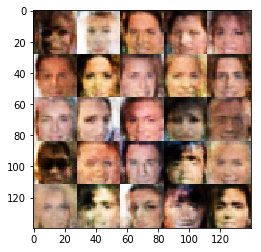

Epoch 1/2... Discriminator Loss: 0.9725... Generator Loss: 0.7353
Epoch 1/2... Discriminator Loss: 1.2209... Generator Loss: 0.6100
Epoch 1/2... Discriminator Loss: 1.0968... Generator Loss: 0.6269
Epoch 1/2... Discriminator Loss: 0.9065... Generator Loss: 1.4201
Epoch 1/2... Discriminator Loss: 1.1769... Generator Loss: 0.5468
Epoch 1/2... Discriminator Loss: 1.3760... Generator Loss: 0.4875
Epoch 1/2... Discriminator Loss: 1.0118... Generator Loss: 0.7541
Epoch 1/2... Discriminator Loss: 1.2073... Generator Loss: 0.6191
Epoch 1/2... Discriminator Loss: 0.9056... Generator Loss: 0.8040
Epoch 1/2... Discriminator Loss: 1.1601... Generator Loss: 0.5217


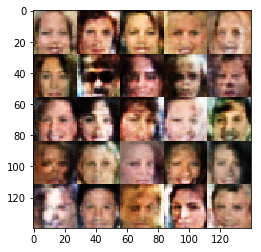

Epoch 1/2... Discriminator Loss: 0.7819... Generator Loss: 1.0642
Epoch 1/2... Discriminator Loss: 1.0448... Generator Loss: 0.8039
Epoch 1/2... Discriminator Loss: 1.1836... Generator Loss: 0.6121
Epoch 1/2... Discriminator Loss: 1.1960... Generator Loss: 0.5173
Epoch 1/2... Discriminator Loss: 1.2190... Generator Loss: 0.4978
Epoch 1/2... Discriminator Loss: 1.0213... Generator Loss: 0.7897
Epoch 1/2... Discriminator Loss: 1.1200... Generator Loss: 0.7747
Epoch 1/2... Discriminator Loss: 1.2852... Generator Loss: 0.4876
Epoch 1/2... Discriminator Loss: 0.9387... Generator Loss: 1.4102
Epoch 1/2... Discriminator Loss: 0.8585... Generator Loss: 1.0605


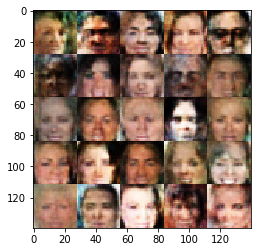

Epoch 1/2... Discriminator Loss: 0.9788... Generator Loss: 0.6970
Epoch 1/2... Discriminator Loss: 1.3284... Generator Loss: 0.4273
Epoch 1/2... Discriminator Loss: 0.8697... Generator Loss: 0.7288
Epoch 1/2... Discriminator Loss: 1.4319... Generator Loss: 0.3978
Epoch 1/2... Discriminator Loss: 0.7079... Generator Loss: 1.0885
Epoch 1/2... Discriminator Loss: 1.0283... Generator Loss: 0.6257
Epoch 1/2... Discriminator Loss: 1.4273... Generator Loss: 0.5288
Epoch 1/2... Discriminator Loss: 0.8880... Generator Loss: 1.3391
Epoch 1/2... Discriminator Loss: 1.2233... Generator Loss: 0.5029
Epoch 1/2... Discriminator Loss: 1.0006... Generator Loss: 1.2995


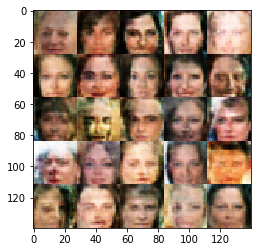

Epoch 1/2... Discriminator Loss: 1.0760... Generator Loss: 0.6566
Epoch 1/2... Discriminator Loss: 1.1240... Generator Loss: 0.6975
Epoch 1/2... Discriminator Loss: 1.0271... Generator Loss: 0.6786
Epoch 1/2... Discriminator Loss: 1.1616... Generator Loss: 0.6175
Epoch 1/2... Discriminator Loss: 0.9093... Generator Loss: 1.2276
Epoch 1/2... Discriminator Loss: 1.0774... Generator Loss: 0.7104
Epoch 1/2... Discriminator Loss: 1.1608... Generator Loss: 0.5116
Epoch 1/2... Discriminator Loss: 1.6782... Generator Loss: 0.3347
Epoch 1/2... Discriminator Loss: 1.2599... Generator Loss: 0.5439
Epoch 1/2... Discriminator Loss: 1.0148... Generator Loss: 0.8499


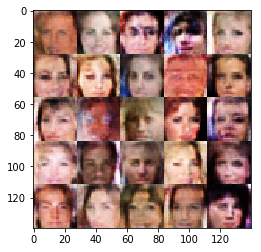

Epoch 1/2... Discriminator Loss: 0.9254... Generator Loss: 0.7842
Epoch 1/2... Discriminator Loss: 1.0729... Generator Loss: 0.7218
Epoch 1/2... Discriminator Loss: 0.9267... Generator Loss: 0.7758
Epoch 1/2... Discriminator Loss: 0.9956... Generator Loss: 1.0026
Epoch 1/2... Discriminator Loss: 0.5443... Generator Loss: 1.3942
Epoch 1/2... Discriminator Loss: 1.2719... Generator Loss: 0.4954
Epoch 1/2... Discriminator Loss: 1.5763... Generator Loss: 0.3017
Epoch 1/2... Discriminator Loss: 1.2741... Generator Loss: 0.4959
Epoch 1/2... Discriminator Loss: 0.7248... Generator Loss: 1.2141
Epoch 1/2... Discriminator Loss: 0.9621... Generator Loss: 0.6947


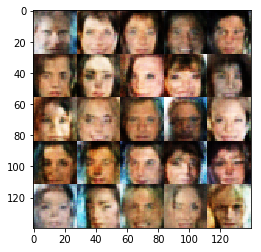

Epoch 1/2... Discriminator Loss: 1.3354... Generator Loss: 0.5810
Epoch 1/2... Discriminator Loss: 0.9837... Generator Loss: 0.6491
Epoch 1/2... Discriminator Loss: 0.7993... Generator Loss: 0.8286
Epoch 1/2... Discriminator Loss: 1.1347... Generator Loss: 0.8442
Epoch 1/2... Discriminator Loss: 0.8848... Generator Loss: 0.7877
Epoch 1/2... Discriminator Loss: 0.6103... Generator Loss: 1.1130
Epoch 1/2... Discriminator Loss: 1.0623... Generator Loss: 0.5665
Epoch 1/2... Discriminator Loss: 0.9358... Generator Loss: 0.7387
Epoch 1/2... Discriminator Loss: 0.9501... Generator Loss: 0.7901
Epoch 1/2... Discriminator Loss: 1.1333... Generator Loss: 0.5304


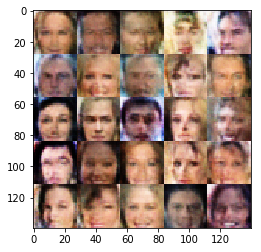

Epoch 1/2... Discriminator Loss: 1.3716... Generator Loss: 0.7509
Epoch 1/2... Discriminator Loss: 1.1460... Generator Loss: 0.5306
Epoch 1/2... Discriminator Loss: 1.0453... Generator Loss: 0.7072
Epoch 1/2... Discriminator Loss: 1.0083... Generator Loss: 0.8711
Epoch 1/2... Discriminator Loss: 1.0383... Generator Loss: 0.5927
Epoch 1/2... Discriminator Loss: 1.2045... Generator Loss: 0.5758
Epoch 1/2... Discriminator Loss: 1.2786... Generator Loss: 0.5505
Epoch 1/2... Discriminator Loss: 0.9240... Generator Loss: 0.6974
Epoch 1/2... Discriminator Loss: 0.7713... Generator Loss: 1.1236
Epoch 1/2... Discriminator Loss: 1.1735... Generator Loss: 0.4881


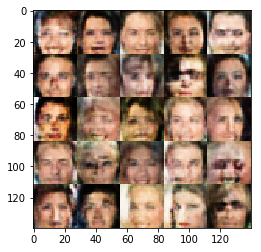

Epoch 1/2... Discriminator Loss: 1.1685... Generator Loss: 0.7337
Epoch 1/2... Discriminator Loss: 0.9932... Generator Loss: 0.7840
Epoch 1/2... Discriminator Loss: 1.0144... Generator Loss: 0.6158
Epoch 1/2... Discriminator Loss: 1.0392... Generator Loss: 0.9516
Epoch 1/2... Discriminator Loss: 0.9200... Generator Loss: 0.8144
Epoch 1/2... Discriminator Loss: 0.8571... Generator Loss: 0.9187
Epoch 1/2... Discriminator Loss: 0.9171... Generator Loss: 0.8318
Epoch 1/2... Discriminator Loss: 1.6470... Generator Loss: 0.3421
Epoch 1/2... Discriminator Loss: 0.7114... Generator Loss: 1.3572
Epoch 1/2... Discriminator Loss: 1.2657... Generator Loss: 0.4419


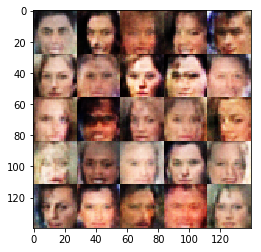

Epoch 1/2... Discriminator Loss: 0.7436... Generator Loss: 1.2944
Epoch 1/2... Discriminator Loss: 1.0042... Generator Loss: 0.8241
Epoch 1/2... Discriminator Loss: 1.1271... Generator Loss: 0.7958
Epoch 1/2... Discriminator Loss: 1.6134... Generator Loss: 0.2996
Epoch 1/2... Discriminator Loss: 1.0018... Generator Loss: 0.9246
Epoch 1/2... Discriminator Loss: 0.8809... Generator Loss: 1.0984
Epoch 1/2... Discriminator Loss: 1.0335... Generator Loss: 0.7246
Epoch 1/2... Discriminator Loss: 1.0163... Generator Loss: 0.6509
Epoch 1/2... Discriminator Loss: 1.2552... Generator Loss: 0.5216
Epoch 1/2... Discriminator Loss: 1.0829... Generator Loss: 0.5863


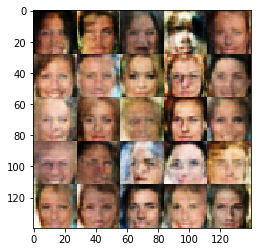

Epoch 1/2... Discriminator Loss: 0.7041... Generator Loss: 0.9712
Epoch 1/2... Discriminator Loss: 1.0142... Generator Loss: 0.6989
Epoch 1/2... Discriminator Loss: 0.9950... Generator Loss: 0.6998
Epoch 1/2... Discriminator Loss: 1.1628... Generator Loss: 0.4922
Epoch 1/2... Discriminator Loss: 0.7492... Generator Loss: 1.0884
Epoch 1/2... Discriminator Loss: 1.0506... Generator Loss: 0.5699
Epoch 1/2... Discriminator Loss: 1.7183... Generator Loss: 0.2486
Epoch 1/2... Discriminator Loss: 1.1281... Generator Loss: 0.7045
Epoch 1/2... Discriminator Loss: 1.3004... Generator Loss: 0.4420
Epoch 1/2... Discriminator Loss: 1.1133... Generator Loss: 0.5732


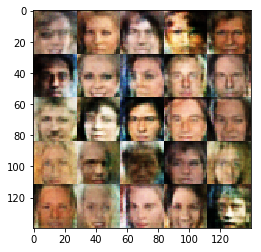

Epoch 1/2... Discriminator Loss: 1.3434... Generator Loss: 0.4891
Epoch 1/2... Discriminator Loss: 1.3261... Generator Loss: 0.4374
Epoch 1/2... Discriminator Loss: 0.8596... Generator Loss: 0.9128
Epoch 1/2... Discriminator Loss: 0.7548... Generator Loss: 1.0306
Epoch 1/2... Discriminator Loss: 1.5748... Generator Loss: 0.4673
Epoch 1/2... Discriminator Loss: 1.2838... Generator Loss: 0.5176
Epoch 1/2... Discriminator Loss: 0.7098... Generator Loss: 1.1020
Epoch 1/2... Discriminator Loss: 0.7596... Generator Loss: 0.9462
Epoch 1/2... Discriminator Loss: 1.3290... Generator Loss: 0.4879
Epoch 1/2... Discriminator Loss: 0.9195... Generator Loss: 0.8722


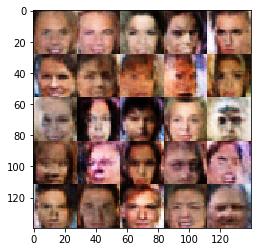

Epoch 1/2... Discriminator Loss: 0.8772... Generator Loss: 0.8700
Epoch 1/2... Discriminator Loss: 1.0737... Generator Loss: 0.6003
Epoch 1/2... Discriminator Loss: 0.9565... Generator Loss: 0.7736
Epoch 1/2... Discriminator Loss: 0.8608... Generator Loss: 0.8583
Epoch 1/2... Discriminator Loss: 0.8697... Generator Loss: 1.2269
Epoch 1/2... Discriminator Loss: 1.0872... Generator Loss: 0.9645
Epoch 1/2... Discriminator Loss: 0.8834... Generator Loss: 0.8464
Epoch 1/2... Discriminator Loss: 0.7897... Generator Loss: 0.9373
Epoch 1/2... Discriminator Loss: 0.7423... Generator Loss: 1.1561
Epoch 1/2... Discriminator Loss: 0.4497... Generator Loss: 1.3865


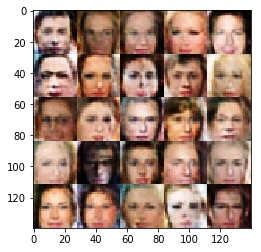

Epoch 1/2... Discriminator Loss: 1.0546... Generator Loss: 0.9451
Epoch 1/2... Discriminator Loss: 0.8604... Generator Loss: 0.7642
Epoch 1/2... Discriminator Loss: 0.9773... Generator Loss: 0.7120
Epoch 1/2... Discriminator Loss: 1.0199... Generator Loss: 0.6340
Epoch 1/2... Discriminator Loss: 0.9238... Generator Loss: 0.7592
Epoch 1/2... Discriminator Loss: 1.1276... Generator Loss: 0.5365
Epoch 1/2... Discriminator Loss: 0.8595... Generator Loss: 1.1167
Epoch 1/2... Discriminator Loss: 1.3048... Generator Loss: 0.4409
Epoch 1/2... Discriminator Loss: 1.4755... Generator Loss: 0.3510
Epoch 1/2... Discriminator Loss: 0.9343... Generator Loss: 0.8385


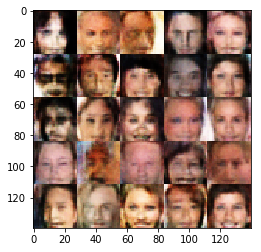

Epoch 1/2... Discriminator Loss: 1.0201... Generator Loss: 0.6601
Epoch 1/2... Discriminator Loss: 0.8013... Generator Loss: 0.8399
Epoch 1/2... Discriminator Loss: 0.8576... Generator Loss: 1.0429
Epoch 1/2... Discriminator Loss: 0.9388... Generator Loss: 0.8304
Epoch 1/2... Discriminator Loss: 0.6878... Generator Loss: 1.0149
Epoch 1/2... Discriminator Loss: 1.0606... Generator Loss: 0.7884
Epoch 1/2... Discriminator Loss: 1.0545... Generator Loss: 1.1220
Epoch 1/2... Discriminator Loss: 0.6864... Generator Loss: 1.1222
Epoch 1/2... Discriminator Loss: 1.5540... Generator Loss: 0.3264
Epoch 1/2... Discriminator Loss: 0.6545... Generator Loss: 0.9224


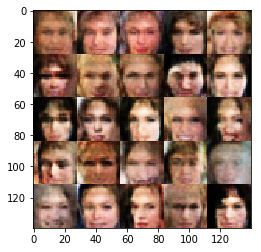

Epoch 1/2... Discriminator Loss: 1.3764... Generator Loss: 0.5969
Epoch 1/2... Discriminator Loss: 0.9680... Generator Loss: 0.8920
Epoch 1/2... Discriminator Loss: 1.0705... Generator Loss: 0.6980
Epoch 1/2... Discriminator Loss: 1.2793... Generator Loss: 0.4292
Epoch 1/2... Discriminator Loss: 1.1818... Generator Loss: 0.5860
Epoch 1/2... Discriminator Loss: 1.4548... Generator Loss: 0.3477
Epoch 1/2... Discriminator Loss: 1.2291... Generator Loss: 0.5034
Epoch 1/2... Discriminator Loss: 0.8083... Generator Loss: 1.1919
Epoch 1/2... Discriminator Loss: 0.7786... Generator Loss: 0.8852
Epoch 1/2... Discriminator Loss: 1.1783... Generator Loss: 0.5429


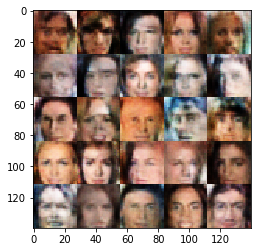

Epoch 1/2... Discriminator Loss: 1.3508... Generator Loss: 0.4266
Epoch 1/2... Discriminator Loss: 1.3983... Generator Loss: 0.4537
Epoch 1/2... Discriminator Loss: 0.8343... Generator Loss: 0.8079
Epoch 1/2... Discriminator Loss: 1.1918... Generator Loss: 0.5298
Epoch 1/2... Discriminator Loss: 1.0433... Generator Loss: 0.7000
Epoch 1/2... Discriminator Loss: 1.1998... Generator Loss: 0.5985
Epoch 1/2... Discriminator Loss: 0.8316... Generator Loss: 1.0862
Epoch 1/2... Discriminator Loss: 1.4005... Generator Loss: 0.3926
Epoch 1/2... Discriminator Loss: 0.9987... Generator Loss: 1.3009
Epoch 1/2... Discriminator Loss: 0.8833... Generator Loss: 1.0976


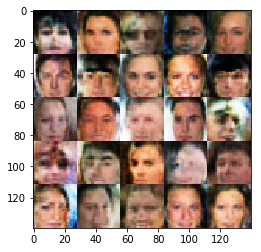

Epoch 1/2... Discriminator Loss: 1.1347... Generator Loss: 0.6012
Epoch 1/2... Discriminator Loss: 1.5607... Generator Loss: 0.3200
Epoch 1/2... Discriminator Loss: 1.4144... Generator Loss: 0.3672
Epoch 1/2... Discriminator Loss: 0.8228... Generator Loss: 1.1617
Epoch 1/2... Discriminator Loss: 0.8734... Generator Loss: 0.8546
Epoch 1/2... Discriminator Loss: 0.8494... Generator Loss: 0.8694
Epoch 1/2... Discriminator Loss: 0.9849... Generator Loss: 0.7841
Epoch 1/2... Discriminator Loss: 0.8671... Generator Loss: 0.7741
Epoch 1/2... Discriminator Loss: 0.8906... Generator Loss: 0.8420
Epoch 1/2... Discriminator Loss: 0.9657... Generator Loss: 1.1641


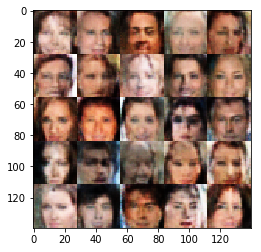

Epoch 1/2... Discriminator Loss: 1.7299... Generator Loss: 0.2472
Epoch 1/2... Discriminator Loss: 0.8290... Generator Loss: 0.9594
Epoch 1/2... Discriminator Loss: 1.1326... Generator Loss: 0.5908
Epoch 1/2... Discriminator Loss: 1.0814... Generator Loss: 0.6516
Epoch 1/2... Discriminator Loss: 1.0487... Generator Loss: 0.7225
Epoch 1/2... Discriminator Loss: 0.7719... Generator Loss: 1.0731
Epoch 1/2... Discriminator Loss: 0.9915... Generator Loss: 0.7559
Epoch 1/2... Discriminator Loss: 1.0619... Generator Loss: 0.7662
Epoch 1/2... Discriminator Loss: 1.1058... Generator Loss: 0.8191
Epoch 1/2... Discriminator Loss: 0.9702... Generator Loss: 1.0533


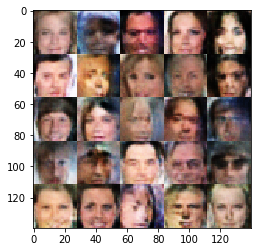

Epoch 1/2... Discriminator Loss: 0.9577... Generator Loss: 1.9291
Epoch 1/2... Discriminator Loss: 0.7904... Generator Loss: 0.9871
Epoch 1/2... Discriminator Loss: 1.3187... Generator Loss: 0.3887
Epoch 1/2... Discriminator Loss: 0.9421... Generator Loss: 1.0107
Epoch 1/2... Discriminator Loss: 1.1540... Generator Loss: 0.6223
Epoch 1/2... Discriminator Loss: 1.0310... Generator Loss: 1.1683
Epoch 1/2... Discriminator Loss: 0.7635... Generator Loss: 0.8797
Epoch 1/2... Discriminator Loss: 1.6798... Generator Loss: 0.4326
Epoch 1/2... Discriminator Loss: 1.0746... Generator Loss: 0.6123
Epoch 1/2... Discriminator Loss: 0.9310... Generator Loss: 0.7669


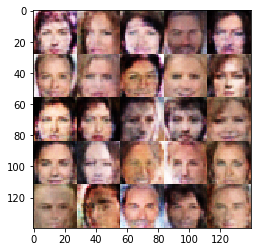

Epoch 1/2... Discriminator Loss: 0.9168... Generator Loss: 1.1283
Epoch 1/2... Discriminator Loss: 0.7485... Generator Loss: 0.8625
Epoch 1/2... Discriminator Loss: 1.2893... Generator Loss: 0.5059
Epoch 1/2... Discriminator Loss: 1.2971... Generator Loss: 0.4362
Epoch 1/2... Discriminator Loss: 0.8953... Generator Loss: 1.1412
Epoch 1/2... Discriminator Loss: 0.9920... Generator Loss: 0.7017
Epoch 1/2... Discriminator Loss: 0.7365... Generator Loss: 1.0513
Epoch 1/2... Discriminator Loss: 0.8453... Generator Loss: 1.2319
Epoch 1/2... Discriminator Loss: 1.0365... Generator Loss: 0.6873
Epoch 1/2... Discriminator Loss: 0.8344... Generator Loss: 0.7987


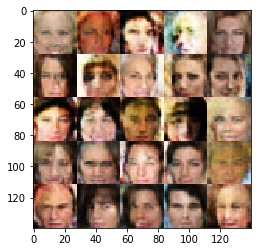

Epoch 1/2... Discriminator Loss: 0.8499... Generator Loss: 0.8604
Epoch 1/2... Discriminator Loss: 1.1318... Generator Loss: 0.7051
Epoch 1/2... Discriminator Loss: 0.9366... Generator Loss: 1.3084
Epoch 1/2... Discriminator Loss: 1.2771... Generator Loss: 0.6211
Epoch 1/2... Discriminator Loss: 0.9699... Generator Loss: 0.8933
Epoch 1/2... Discriminator Loss: 1.2918... Generator Loss: 0.5254
Epoch 1/2... Discriminator Loss: 1.1839... Generator Loss: 0.5644
Epoch 1/2... Discriminator Loss: 1.6283... Generator Loss: 0.2890
Epoch 1/2... Discriminator Loss: 1.1249... Generator Loss: 0.6123
Epoch 1/2... Discriminator Loss: 1.6140... Generator Loss: 0.2870


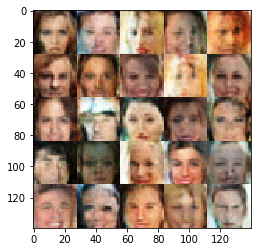

Epoch 1/2... Discriminator Loss: 1.4891... Generator Loss: 0.3518
Epoch 1/2... Discriminator Loss: 1.2424... Generator Loss: 0.5827
Epoch 1/2... Discriminator Loss: 1.3845... Generator Loss: 0.4172
Epoch 1/2... Discriminator Loss: 1.1721... Generator Loss: 0.5341
Epoch 1/2... Discriminator Loss: 1.3027... Generator Loss: 0.4112
Epoch 1/2... Discriminator Loss: 0.8218... Generator Loss: 1.3259
Epoch 1/2... Discriminator Loss: 0.6690... Generator Loss: 1.2741
Epoch 1/2... Discriminator Loss: 1.2339... Generator Loss: 0.4542
Epoch 1/2... Discriminator Loss: 0.7962... Generator Loss: 0.8537
Epoch 1/2... Discriminator Loss: 1.0989... Generator Loss: 0.6596


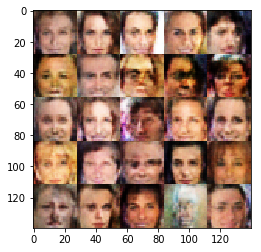

Epoch 1/2... Discriminator Loss: 1.7062... Generator Loss: 0.2761
Epoch 1/2... Discriminator Loss: 1.0862... Generator Loss: 0.7594
Epoch 1/2... Discriminator Loss: 0.9434... Generator Loss: 0.8958
Epoch 1/2... Discriminator Loss: 0.7853... Generator Loss: 0.9885
Epoch 1/2... Discriminator Loss: 1.1161... Generator Loss: 0.6056
Epoch 1/2... Discriminator Loss: 0.6925... Generator Loss: 1.0828
Epoch 1/2... Discriminator Loss: 0.8239... Generator Loss: 0.8869
Epoch 1/2... Discriminator Loss: 1.0682... Generator Loss: 0.6405
Epoch 1/2... Discriminator Loss: 0.9672... Generator Loss: 0.7021
Epoch 1/2... Discriminator Loss: 1.4117... Generator Loss: 0.3881


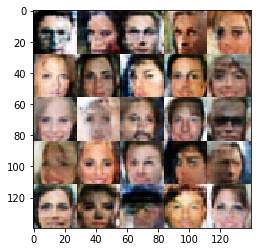

Epoch 1/2... Discriminator Loss: 0.7590... Generator Loss: 1.3069
Epoch 1/2... Discriminator Loss: 0.5623... Generator Loss: 1.3163
Epoch 1/2... Discriminator Loss: 1.3492... Generator Loss: 0.3749
Epoch 1/2... Discriminator Loss: 1.7884... Generator Loss: 0.2752
Epoch 1/2... Discriminator Loss: 1.1301... Generator Loss: 0.6156
Epoch 1/2... Discriminator Loss: 1.1039... Generator Loss: 0.5487
Epoch 1/2... Discriminator Loss: 0.9633... Generator Loss: 1.1005
Epoch 1/2... Discriminator Loss: 0.7930... Generator Loss: 1.0919
Epoch 1/2... Discriminator Loss: 0.9406... Generator Loss: 0.6407
Epoch 1/2... Discriminator Loss: 1.8218... Generator Loss: 0.2531


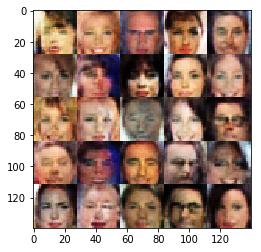

Epoch 1/2... Discriminator Loss: 0.9035... Generator Loss: 1.3181
Epoch 1/2... Discriminator Loss: 1.0278... Generator Loss: 1.0372
Epoch 1/2... Discriminator Loss: 1.1608... Generator Loss: 0.4979
Epoch 1/2... Discriminator Loss: 0.7174... Generator Loss: 0.9395
Epoch 1/2... Discriminator Loss: 1.8564... Generator Loss: 0.5298
Epoch 1/2... Discriminator Loss: 0.8555... Generator Loss: 1.1721
Epoch 1/2... Discriminator Loss: 0.9932... Generator Loss: 0.6862
Epoch 1/2... Discriminator Loss: 0.9684... Generator Loss: 0.7808
Epoch 1/2... Discriminator Loss: 0.9044... Generator Loss: 0.7793
Epoch 1/2... Discriminator Loss: 0.6278... Generator Loss: 1.4413


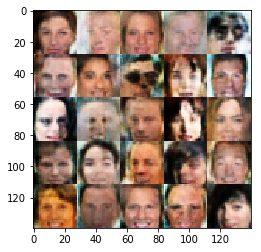

Epoch 1/2... Discriminator Loss: 0.8156... Generator Loss: 0.8322
Epoch 1/2... Discriminator Loss: 0.6638... Generator Loss: 1.5852
Epoch 1/2... Discriminator Loss: 0.8026... Generator Loss: 0.8496
Epoch 1/2... Discriminator Loss: 0.8793... Generator Loss: 0.9036
Epoch 1/2... Discriminator Loss: 1.0580... Generator Loss: 1.1562
Epoch 1/2... Discriminator Loss: 1.2214... Generator Loss: 0.4553
Epoch 1/2... Discriminator Loss: 0.9221... Generator Loss: 0.7979
Epoch 1/2... Discriminator Loss: 1.0841... Generator Loss: 0.5552
Epoch 1/2... Discriminator Loss: 1.1416... Generator Loss: 0.9124
Epoch 1/2... Discriminator Loss: 1.4722... Generator Loss: 0.3356


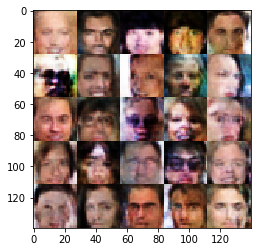

Epoch 1/2... Discriminator Loss: 1.4617... Generator Loss: 0.3485
Epoch 1/2... Discriminator Loss: 0.9416... Generator Loss: 0.8813
Epoch 1/2... Discriminator Loss: 1.0031... Generator Loss: 0.6059
Epoch 1/2... Discriminator Loss: 1.0562... Generator Loss: 0.6293
Epoch 1/2... Discriminator Loss: 1.2342... Generator Loss: 0.5413
Epoch 1/2... Discriminator Loss: 1.3510... Generator Loss: 0.4020
Epoch 1/2... Discriminator Loss: 1.0260... Generator Loss: 0.6985
Epoch 1/2... Discriminator Loss: 1.1227... Generator Loss: 0.8667
Epoch 1/2... Discriminator Loss: 1.3266... Generator Loss: 0.4219
Epoch 1/2... Discriminator Loss: 1.5081... Generator Loss: 0.3414


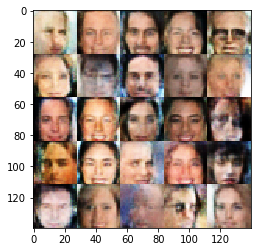

Epoch 1/2... Discriminator Loss: 1.0439... Generator Loss: 0.6677
Epoch 1/2... Discriminator Loss: 0.8707... Generator Loss: 1.1763
Epoch 1/2... Discriminator Loss: 1.1378... Generator Loss: 0.6358
Epoch 1/2... Discriminator Loss: 0.9816... Generator Loss: 0.7384
Epoch 1/2... Discriminator Loss: 1.0441... Generator Loss: 0.7149
Epoch 1/2... Discriminator Loss: 0.8950... Generator Loss: 0.6595
Epoch 1/2... Discriminator Loss: 1.1314... Generator Loss: 0.6395
Epoch 1/2... Discriminator Loss: 0.8731... Generator Loss: 0.7843
Epoch 1/2... Discriminator Loss: 0.8296... Generator Loss: 0.9566
Epoch 1/2... Discriminator Loss: 1.0993... Generator Loss: 0.6238


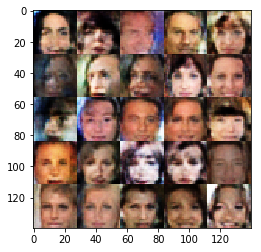

Epoch 1/2... Discriminator Loss: 1.1198... Generator Loss: 0.5528
Epoch 1/2... Discriminator Loss: 1.1262... Generator Loss: 0.5400
Epoch 1/2... Discriminator Loss: 0.9827... Generator Loss: 0.8508
Epoch 1/2... Discriminator Loss: 0.6626... Generator Loss: 1.5192
Epoch 1/2... Discriminator Loss: 1.0276... Generator Loss: 0.7806
Epoch 1/2... Discriminator Loss: 1.1470... Generator Loss: 0.5228
Epoch 1/2... Discriminator Loss: 0.8846... Generator Loss: 0.7664
Epoch 1/2... Discriminator Loss: 0.8029... Generator Loss: 0.8731
Epoch 1/2... Discriminator Loss: 1.3642... Generator Loss: 0.4637
Epoch 1/2... Discriminator Loss: 1.1346... Generator Loss: 0.6061


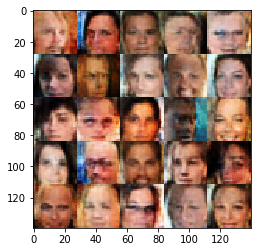

Epoch 1/2... Discriminator Loss: 0.7221... Generator Loss: 1.2325
Epoch 1/2... Discriminator Loss: 0.9537... Generator Loss: 0.9116
Epoch 1/2... Discriminator Loss: 0.8625... Generator Loss: 0.8574
Epoch 2/2... Discriminator Loss: 1.0429... Generator Loss: 0.6447
Epoch 2/2... Discriminator Loss: 1.0902... Generator Loss: 0.6510
Epoch 2/2... Discriminator Loss: 1.0609... Generator Loss: 1.0916
Epoch 2/2... Discriminator Loss: 0.6662... Generator Loss: 1.0509
Epoch 2/2... Discriminator Loss: 1.0465... Generator Loss: 0.5863
Epoch 2/2... Discriminator Loss: 0.9751... Generator Loss: 0.7036
Epoch 2/2... Discriminator Loss: 0.9457... Generator Loss: 0.7571


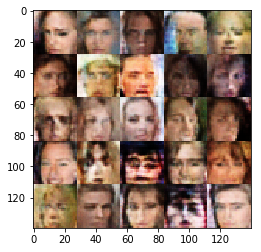

Epoch 2/2... Discriminator Loss: 1.0215... Generator Loss: 0.6073
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.4024
Epoch 2/2... Discriminator Loss: 0.6368... Generator Loss: 1.1300
Epoch 2/2... Discriminator Loss: 1.1638... Generator Loss: 0.6975
Epoch 2/2... Discriminator Loss: 1.1055... Generator Loss: 0.5425
Epoch 2/2... Discriminator Loss: 0.9827... Generator Loss: 0.7025
Epoch 2/2... Discriminator Loss: 1.8057... Generator Loss: 0.2127
Epoch 2/2... Discriminator Loss: 1.2410... Generator Loss: 0.5787
Epoch 2/2... Discriminator Loss: 1.3831... Generator Loss: 0.4360
Epoch 2/2... Discriminator Loss: 1.2688... Generator Loss: 0.4783


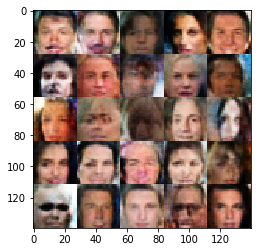

Epoch 2/2... Discriminator Loss: 1.1305... Generator Loss: 0.6823
Epoch 2/2... Discriminator Loss: 0.9004... Generator Loss: 0.7362
Epoch 2/2... Discriminator Loss: 0.5861... Generator Loss: 1.6636
Epoch 2/2... Discriminator Loss: 0.6482... Generator Loss: 1.0265
Epoch 2/2... Discriminator Loss: 0.8104... Generator Loss: 1.1737
Epoch 2/2... Discriminator Loss: 0.9125... Generator Loss: 1.1350
Epoch 2/2... Discriminator Loss: 1.1393... Generator Loss: 1.2435
Epoch 2/2... Discriminator Loss: 0.9758... Generator Loss: 0.8839
Epoch 2/2... Discriminator Loss: 0.8386... Generator Loss: 0.8448
Epoch 2/2... Discriminator Loss: 1.3176... Generator Loss: 0.4728


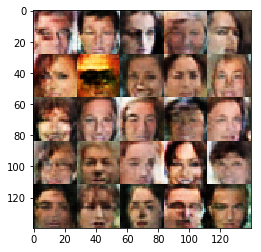

Epoch 2/2... Discriminator Loss: 1.4604... Generator Loss: 0.3474
Epoch 2/2... Discriminator Loss: 1.1516... Generator Loss: 1.6015
Epoch 2/2... Discriminator Loss: 0.9441... Generator Loss: 0.6733
Epoch 2/2... Discriminator Loss: 1.1608... Generator Loss: 0.5660
Epoch 2/2... Discriminator Loss: 1.2324... Generator Loss: 0.4263
Epoch 2/2... Discriminator Loss: 0.8498... Generator Loss: 0.8431
Epoch 2/2... Discriminator Loss: 0.8746... Generator Loss: 0.9955
Epoch 2/2... Discriminator Loss: 0.8187... Generator Loss: 1.0536
Epoch 2/2... Discriminator Loss: 1.1482... Generator Loss: 0.4999
Epoch 2/2... Discriminator Loss: 0.8664... Generator Loss: 0.8551


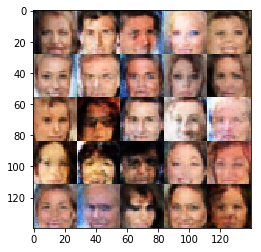

Epoch 2/2... Discriminator Loss: 0.6492... Generator Loss: 1.3199
Epoch 2/2... Discriminator Loss: 0.7044... Generator Loss: 1.0507
Epoch 2/2... Discriminator Loss: 1.0363... Generator Loss: 0.5951
Epoch 2/2... Discriminator Loss: 0.6247... Generator Loss: 1.0894
Epoch 2/2... Discriminator Loss: 1.5347... Generator Loss: 0.3452
Epoch 2/2... Discriminator Loss: 0.8793... Generator Loss: 0.7705
Epoch 2/2... Discriminator Loss: 1.2246... Generator Loss: 1.0247
Epoch 2/2... Discriminator Loss: 1.9364... Generator Loss: 0.2538
Epoch 2/2... Discriminator Loss: 1.0130... Generator Loss: 1.0657
Epoch 2/2... Discriminator Loss: 0.9548... Generator Loss: 0.6295


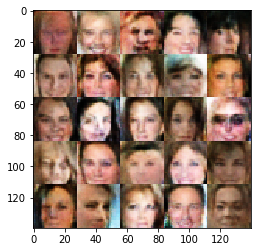

Epoch 2/2... Discriminator Loss: 1.4069... Generator Loss: 0.4706
Epoch 2/2... Discriminator Loss: 1.3500... Generator Loss: 0.4133
Epoch 2/2... Discriminator Loss: 0.7742... Generator Loss: 0.9416
Epoch 2/2... Discriminator Loss: 0.7390... Generator Loss: 1.0186
Epoch 2/2... Discriminator Loss: 1.3051... Generator Loss: 0.3829
Epoch 2/2... Discriminator Loss: 1.0348... Generator Loss: 0.6673
Epoch 2/2... Discriminator Loss: 1.4489... Generator Loss: 0.3562
Epoch 2/2... Discriminator Loss: 0.9643... Generator Loss: 0.6703
Epoch 2/2... Discriminator Loss: 1.0968... Generator Loss: 0.6077
Epoch 2/2... Discriminator Loss: 0.9996... Generator Loss: 0.8594


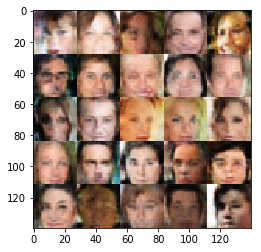

Epoch 2/2... Discriminator Loss: 0.9962... Generator Loss: 0.7160
Epoch 2/2... Discriminator Loss: 1.1220... Generator Loss: 0.8589
Epoch 2/2... Discriminator Loss: 1.0569... Generator Loss: 0.5698
Epoch 2/2... Discriminator Loss: 1.0780... Generator Loss: 0.9561
Epoch 2/2... Discriminator Loss: 1.1497... Generator Loss: 0.4677
Epoch 2/2... Discriminator Loss: 1.0804... Generator Loss: 0.5694
Epoch 2/2... Discriminator Loss: 0.8506... Generator Loss: 0.7707
Epoch 2/2... Discriminator Loss: 1.8724... Generator Loss: 0.2645
Epoch 2/2... Discriminator Loss: 1.0066... Generator Loss: 0.7270
Epoch 2/2... Discriminator Loss: 0.7272... Generator Loss: 0.9952


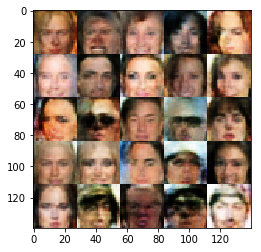

Epoch 2/2... Discriminator Loss: 1.0134... Generator Loss: 0.6121
Epoch 2/2... Discriminator Loss: 0.7535... Generator Loss: 1.7130
Epoch 2/2... Discriminator Loss: 0.9152... Generator Loss: 0.7587
Epoch 2/2... Discriminator Loss: 1.0941... Generator Loss: 0.6535
Epoch 2/2... Discriminator Loss: 0.7603... Generator Loss: 1.0800
Epoch 2/2... Discriminator Loss: 1.0490... Generator Loss: 0.6603
Epoch 2/2... Discriminator Loss: 0.9766... Generator Loss: 0.6402
Epoch 2/2... Discriminator Loss: 1.2638... Generator Loss: 0.4092
Epoch 2/2... Discriminator Loss: 1.0948... Generator Loss: 0.5213
Epoch 2/2... Discriminator Loss: 0.8641... Generator Loss: 0.8988


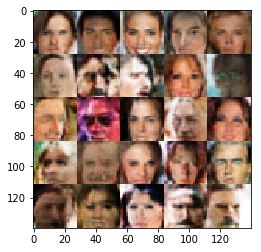

Epoch 2/2... Discriminator Loss: 1.0958... Generator Loss: 0.5795
Epoch 2/2... Discriminator Loss: 1.2074... Generator Loss: 0.4460
Epoch 2/2... Discriminator Loss: 1.0329... Generator Loss: 0.6770
Epoch 2/2... Discriminator Loss: 1.0154... Generator Loss: 0.5762
Epoch 2/2... Discriminator Loss: 0.9818... Generator Loss: 0.7909
Epoch 2/2... Discriminator Loss: 0.8189... Generator Loss: 1.9936
Epoch 2/2... Discriminator Loss: 0.6196... Generator Loss: 1.7764
Epoch 2/2... Discriminator Loss: 0.9395... Generator Loss: 0.8809
Epoch 2/2... Discriminator Loss: 1.3899... Generator Loss: 0.3997
Epoch 2/2... Discriminator Loss: 0.8222... Generator Loss: 1.3564


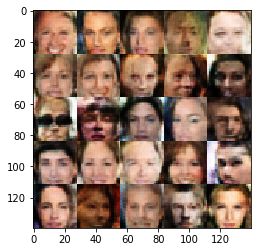

Epoch 2/2... Discriminator Loss: 1.2932... Generator Loss: 0.5218
Epoch 2/2... Discriminator Loss: 1.1146... Generator Loss: 0.6196
Epoch 2/2... Discriminator Loss: 1.1827... Generator Loss: 0.5211
Epoch 2/2... Discriminator Loss: 0.8585... Generator Loss: 0.9545
Epoch 2/2... Discriminator Loss: 1.0049... Generator Loss: 1.1786
Epoch 2/2... Discriminator Loss: 0.8473... Generator Loss: 0.8501
Epoch 2/2... Discriminator Loss: 0.6924... Generator Loss: 1.0262
Epoch 2/2... Discriminator Loss: 1.2900... Generator Loss: 0.4188
Epoch 2/2... Discriminator Loss: 0.7558... Generator Loss: 0.9435
Epoch 2/2... Discriminator Loss: 0.9231... Generator Loss: 0.7587


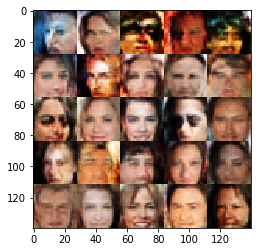

Epoch 2/2... Discriminator Loss: 1.3598... Generator Loss: 0.3917
Epoch 2/2... Discriminator Loss: 0.8874... Generator Loss: 1.1256
Epoch 2/2... Discriminator Loss: 0.9447... Generator Loss: 0.8623
Epoch 2/2... Discriminator Loss: 1.0221... Generator Loss: 0.6652
Epoch 2/2... Discriminator Loss: 1.1692... Generator Loss: 0.5607
Epoch 2/2... Discriminator Loss: 0.9803... Generator Loss: 0.7949
Epoch 2/2... Discriminator Loss: 1.6754... Generator Loss: 0.4312
Epoch 2/2... Discriminator Loss: 0.8782... Generator Loss: 0.9133
Epoch 2/2... Discriminator Loss: 1.1099... Generator Loss: 0.7550
Epoch 2/2... Discriminator Loss: 0.8562... Generator Loss: 0.8081


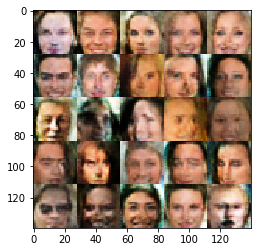

Epoch 2/2... Discriminator Loss: 0.8918... Generator Loss: 0.8982
Epoch 2/2... Discriminator Loss: 0.9178... Generator Loss: 0.9659
Epoch 2/2... Discriminator Loss: 1.1446... Generator Loss: 0.5674
Epoch 2/2... Discriminator Loss: 1.2504... Generator Loss: 0.4371
Epoch 2/2... Discriminator Loss: 0.7921... Generator Loss: 0.8240
Epoch 2/2... Discriminator Loss: 1.3409... Generator Loss: 0.5058
Epoch 2/2... Discriminator Loss: 1.0207... Generator Loss: 0.6558
Epoch 2/2... Discriminator Loss: 1.4209... Generator Loss: 0.5185
Epoch 2/2... Discriminator Loss: 0.9275... Generator Loss: 0.7949
Epoch 2/2... Discriminator Loss: 0.9096... Generator Loss: 0.7032


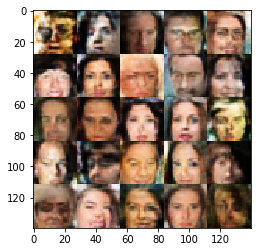

Epoch 2/2... Discriminator Loss: 0.9930... Generator Loss: 0.7216
Epoch 2/2... Discriminator Loss: 1.6401... Generator Loss: 0.2848
Epoch 2/2... Discriminator Loss: 0.9566... Generator Loss: 0.6205
Epoch 2/2... Discriminator Loss: 0.9259... Generator Loss: 0.9599
Epoch 2/2... Discriminator Loss: 0.9982... Generator Loss: 0.7915
Epoch 2/2... Discriminator Loss: 1.1510... Generator Loss: 0.4749
Epoch 2/2... Discriminator Loss: 0.8584... Generator Loss: 1.1536
Epoch 2/2... Discriminator Loss: 1.1679... Generator Loss: 0.5393
Epoch 2/2... Discriminator Loss: 1.0894... Generator Loss: 0.7286
Epoch 2/2... Discriminator Loss: 1.3758... Generator Loss: 0.8530


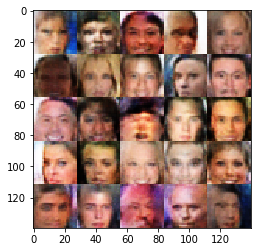

Epoch 2/2... Discriminator Loss: 0.7919... Generator Loss: 1.0131
Epoch 2/2... Discriminator Loss: 0.6788... Generator Loss: 1.1877
Epoch 2/2... Discriminator Loss: 0.7015... Generator Loss: 1.1082
Epoch 2/2... Discriminator Loss: 0.9876... Generator Loss: 0.8980
Epoch 2/2... Discriminator Loss: 1.0505... Generator Loss: 0.5912
Epoch 2/2... Discriminator Loss: 1.4209... Generator Loss: 0.3472
Epoch 2/2... Discriminator Loss: 1.0472... Generator Loss: 1.2584
Epoch 2/2... Discriminator Loss: 0.9981... Generator Loss: 0.8324
Epoch 2/2... Discriminator Loss: 0.7089... Generator Loss: 1.0782
Epoch 2/2... Discriminator Loss: 1.0499... Generator Loss: 0.7959


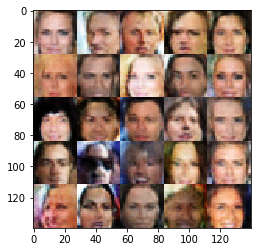

Epoch 2/2... Discriminator Loss: 1.5479... Generator Loss: 0.2985
Epoch 2/2... Discriminator Loss: 1.0452... Generator Loss: 0.8068
Epoch 2/2... Discriminator Loss: 1.1509... Generator Loss: 0.5182
Epoch 2/2... Discriminator Loss: 0.8264... Generator Loss: 0.8284
Epoch 2/2... Discriminator Loss: 1.0065... Generator Loss: 0.6383
Epoch 2/2... Discriminator Loss: 1.1113... Generator Loss: 0.5400
Epoch 2/2... Discriminator Loss: 1.4814... Generator Loss: 0.3426
Epoch 2/2... Discriminator Loss: 1.1624... Generator Loss: 0.5777
Epoch 2/2... Discriminator Loss: 0.9970... Generator Loss: 0.5773
Epoch 2/2... Discriminator Loss: 0.8070... Generator Loss: 0.8477


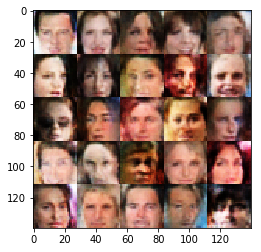

Epoch 2/2... Discriminator Loss: 0.9796... Generator Loss: 0.9237
Epoch 2/2... Discriminator Loss: 0.6891... Generator Loss: 1.0878
Epoch 2/2... Discriminator Loss: 0.8920... Generator Loss: 0.7883
Epoch 2/2... Discriminator Loss: 0.6245... Generator Loss: 1.5687
Epoch 2/2... Discriminator Loss: 1.1934... Generator Loss: 0.6471
Epoch 2/2... Discriminator Loss: 0.6377... Generator Loss: 1.0901
Epoch 2/2... Discriminator Loss: 0.7396... Generator Loss: 0.8609
Epoch 2/2... Discriminator Loss: 0.9546... Generator Loss: 0.9338
Epoch 2/2... Discriminator Loss: 1.0774... Generator Loss: 1.0195
Epoch 2/2... Discriminator Loss: 0.7758... Generator Loss: 1.0382


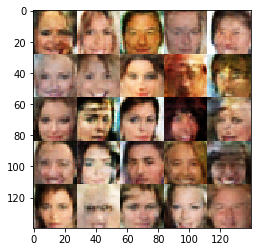

Epoch 2/2... Discriminator Loss: 1.2749... Generator Loss: 0.4927
Epoch 2/2... Discriminator Loss: 0.5871... Generator Loss: 1.2504
Epoch 2/2... Discriminator Loss: 1.5844... Generator Loss: 0.3474
Epoch 2/2... Discriminator Loss: 0.9007... Generator Loss: 0.9053
Epoch 2/2... Discriminator Loss: 0.8091... Generator Loss: 0.8993
Epoch 2/2... Discriminator Loss: 1.0743... Generator Loss: 1.1722
Epoch 2/2... Discriminator Loss: 1.1270... Generator Loss: 0.6697
Epoch 2/2... Discriminator Loss: 0.9433... Generator Loss: 0.7512
Epoch 2/2... Discriminator Loss: 1.1214... Generator Loss: 0.6433
Epoch 2/2... Discriminator Loss: 0.5214... Generator Loss: 1.8096


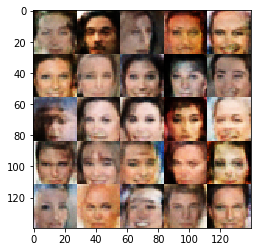

Epoch 2/2... Discriminator Loss: 0.6604... Generator Loss: 1.0475
Epoch 2/2... Discriminator Loss: 1.2959... Generator Loss: 0.4512
Epoch 2/2... Discriminator Loss: 1.0485... Generator Loss: 0.6392
Epoch 2/2... Discriminator Loss: 0.8979... Generator Loss: 0.8425
Epoch 2/2... Discriminator Loss: 1.1719... Generator Loss: 0.5080
Epoch 2/2... Discriminator Loss: 0.9349... Generator Loss: 0.7284
Epoch 2/2... Discriminator Loss: 1.4280... Generator Loss: 0.6530
Epoch 2/2... Discriminator Loss: 1.5127... Generator Loss: 0.3165
Epoch 2/2... Discriminator Loss: 1.3443... Generator Loss: 0.3869
Epoch 2/2... Discriminator Loss: 0.7730... Generator Loss: 1.0106


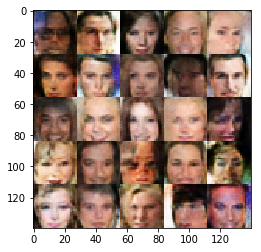

Epoch 2/2... Discriminator Loss: 1.2056... Generator Loss: 0.5756
Epoch 2/2... Discriminator Loss: 0.7658... Generator Loss: 1.0354
Epoch 2/2... Discriminator Loss: 1.1358... Generator Loss: 0.4856
Epoch 2/2... Discriminator Loss: 0.8810... Generator Loss: 0.8322
Epoch 2/2... Discriminator Loss: 1.0414... Generator Loss: 1.2300
Epoch 2/2... Discriminator Loss: 1.0477... Generator Loss: 0.7025
Epoch 2/2... Discriminator Loss: 1.3878... Generator Loss: 0.3999
Epoch 2/2... Discriminator Loss: 1.0355... Generator Loss: 0.8724
Epoch 2/2... Discriminator Loss: 1.0013... Generator Loss: 0.9322
Epoch 2/2... Discriminator Loss: 0.5840... Generator Loss: 1.6835


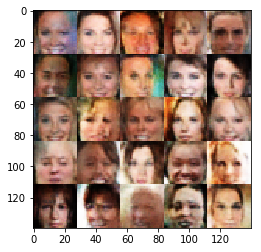

Epoch 2/2... Discriminator Loss: 0.8943... Generator Loss: 0.8253
Epoch 2/2... Discriminator Loss: 0.7228... Generator Loss: 0.9373
Epoch 2/2... Discriminator Loss: 1.0579... Generator Loss: 0.5882
Epoch 2/2... Discriminator Loss: 1.0321... Generator Loss: 0.6625
Epoch 2/2... Discriminator Loss: 0.8826... Generator Loss: 0.9369
Epoch 2/2... Discriminator Loss: 0.6632... Generator Loss: 1.4578
Epoch 2/2... Discriminator Loss: 0.9666... Generator Loss: 0.6694
Epoch 2/2... Discriminator Loss: 1.2111... Generator Loss: 0.5677
Epoch 2/2... Discriminator Loss: 1.2569... Generator Loss: 0.4295
Epoch 2/2... Discriminator Loss: 1.1440... Generator Loss: 0.4714


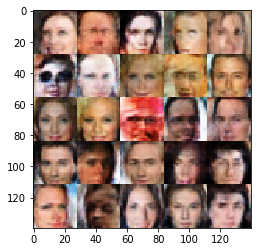

Epoch 2/2... Discriminator Loss: 0.9104... Generator Loss: 0.6598
Epoch 2/2... Discriminator Loss: 1.2089... Generator Loss: 0.4845
Epoch 2/2... Discriminator Loss: 1.0067... Generator Loss: 0.6536
Epoch 2/2... Discriminator Loss: 0.7341... Generator Loss: 1.0377
Epoch 2/2... Discriminator Loss: 1.0026... Generator Loss: 0.6531
Epoch 2/2... Discriminator Loss: 0.9041... Generator Loss: 0.9658
Epoch 2/2... Discriminator Loss: 1.3100... Generator Loss: 0.4041
Epoch 2/2... Discriminator Loss: 0.9714... Generator Loss: 0.7047
Epoch 2/2... Discriminator Loss: 1.0405... Generator Loss: 0.9510
Epoch 2/2... Discriminator Loss: 0.9241... Generator Loss: 0.9552


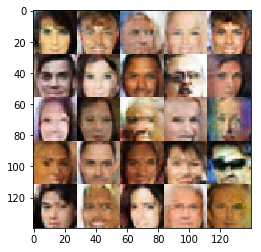

Epoch 2/2... Discriminator Loss: 0.9501... Generator Loss: 0.7298
Epoch 2/2... Discriminator Loss: 0.9719... Generator Loss: 0.8377
Epoch 2/2... Discriminator Loss: 0.9485... Generator Loss: 0.7669
Epoch 2/2... Discriminator Loss: 0.9231... Generator Loss: 0.6845
Epoch 2/2... Discriminator Loss: 1.0499... Generator Loss: 0.6690
Epoch 2/2... Discriminator Loss: 1.3611... Generator Loss: 0.3978
Epoch 2/2... Discriminator Loss: 1.1223... Generator Loss: 0.5485
Epoch 2/2... Discriminator Loss: 0.9862... Generator Loss: 0.7152
Epoch 2/2... Discriminator Loss: 0.8149... Generator Loss: 0.8044
Epoch 2/2... Discriminator Loss: 0.8801... Generator Loss: 0.8353


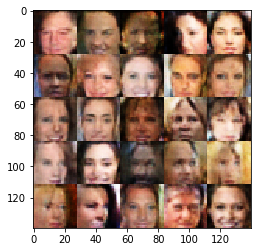

Epoch 2/2... Discriminator Loss: 1.0539... Generator Loss: 0.8884
Epoch 2/2... Discriminator Loss: 1.6133... Generator Loss: 0.2946
Epoch 2/2... Discriminator Loss: 0.6172... Generator Loss: 1.3984
Epoch 2/2... Discriminator Loss: 1.0462... Generator Loss: 0.6906
Epoch 2/2... Discriminator Loss: 1.1860... Generator Loss: 0.5057
Epoch 2/2... Discriminator Loss: 0.9635... Generator Loss: 1.6521
Epoch 2/2... Discriminator Loss: 1.3945... Generator Loss: 0.3691
Epoch 2/2... Discriminator Loss: 1.2324... Generator Loss: 0.4412
Epoch 2/2... Discriminator Loss: 0.7834... Generator Loss: 0.8328
Epoch 2/2... Discriminator Loss: 0.9166... Generator Loss: 0.7440


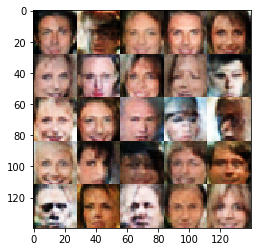

Epoch 2/2... Discriminator Loss: 0.9463... Generator Loss: 0.9580
Epoch 2/2... Discriminator Loss: 1.1562... Generator Loss: 1.0379
Epoch 2/2... Discriminator Loss: 1.1724... Generator Loss: 1.2323
Epoch 2/2... Discriminator Loss: 1.2908... Generator Loss: 0.4037
Epoch 2/2... Discriminator Loss: 0.8971... Generator Loss: 0.9690
Epoch 2/2... Discriminator Loss: 0.7481... Generator Loss: 0.9317
Epoch 2/2... Discriminator Loss: 1.4434... Generator Loss: 0.3893
Epoch 2/2... Discriminator Loss: 0.7945... Generator Loss: 1.0980
Epoch 2/2... Discriminator Loss: 0.8720... Generator Loss: 0.9997
Epoch 2/2... Discriminator Loss: 1.3389... Generator Loss: 0.3998


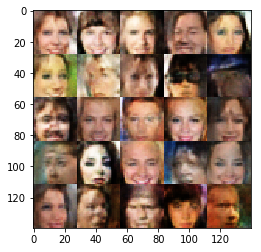

Epoch 2/2... Discriminator Loss: 0.7789... Generator Loss: 0.9548
Epoch 2/2... Discriminator Loss: 1.0694... Generator Loss: 0.6111
Epoch 2/2... Discriminator Loss: 0.9637... Generator Loss: 0.7976
Epoch 2/2... Discriminator Loss: 0.9620... Generator Loss: 1.2671
Epoch 2/2... Discriminator Loss: 1.0719... Generator Loss: 0.5261
Epoch 2/2... Discriminator Loss: 0.6759... Generator Loss: 1.1176
Epoch 2/2... Discriminator Loss: 0.7460... Generator Loss: 0.8910
Epoch 2/2... Discriminator Loss: 0.7224... Generator Loss: 1.3201
Epoch 2/2... Discriminator Loss: 0.8988... Generator Loss: 0.7722
Epoch 2/2... Discriminator Loss: 0.7509... Generator Loss: 0.8668


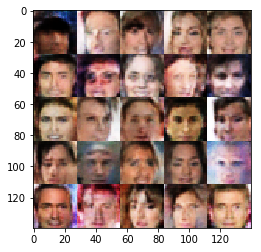

Epoch 2/2... Discriminator Loss: 1.3421... Generator Loss: 0.3992
Epoch 2/2... Discriminator Loss: 1.1686... Generator Loss: 0.7945
Epoch 2/2... Discriminator Loss: 1.1169... Generator Loss: 0.5858
Epoch 2/2... Discriminator Loss: 0.9979... Generator Loss: 1.0929
Epoch 2/2... Discriminator Loss: 1.3573... Generator Loss: 0.4225
Epoch 2/2... Discriminator Loss: 0.9607... Generator Loss: 0.9059
Epoch 2/2... Discriminator Loss: 0.9798... Generator Loss: 0.6100
Epoch 2/2... Discriminator Loss: 1.1049... Generator Loss: 0.6285
Epoch 2/2... Discriminator Loss: 1.4297... Generator Loss: 1.0573
Epoch 2/2... Discriminator Loss: 0.9743... Generator Loss: 0.9966


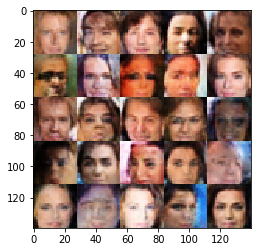

Epoch 2/2... Discriminator Loss: 0.7231... Generator Loss: 1.7657
Epoch 2/2... Discriminator Loss: 1.0154... Generator Loss: 0.8189
Epoch 2/2... Discriminator Loss: 0.9324... Generator Loss: 0.6815
Epoch 2/2... Discriminator Loss: 0.8711... Generator Loss: 0.7139
Epoch 2/2... Discriminator Loss: 0.9475... Generator Loss: 1.0503
Epoch 2/2... Discriminator Loss: 0.9921... Generator Loss: 0.6573
Epoch 2/2... Discriminator Loss: 1.4452... Generator Loss: 0.4049
Epoch 2/2... Discriminator Loss: 1.1805... Generator Loss: 0.5099
Epoch 2/2... Discriminator Loss: 0.7800... Generator Loss: 0.8228
Epoch 2/2... Discriminator Loss: 1.4533... Generator Loss: 0.3354


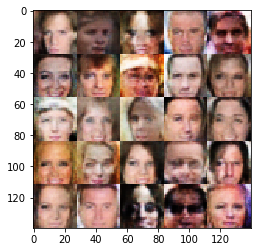

Epoch 2/2... Discriminator Loss: 0.9776... Generator Loss: 0.6797
Epoch 2/2... Discriminator Loss: 1.1206... Generator Loss: 0.6083
Epoch 2/2... Discriminator Loss: 0.8919... Generator Loss: 0.8007
Epoch 2/2... Discriminator Loss: 0.7316... Generator Loss: 1.2191
Epoch 2/2... Discriminator Loss: 0.7242... Generator Loss: 1.0189
Epoch 2/2... Discriminator Loss: 0.7923... Generator Loss: 0.9896
Epoch 2/2... Discriminator Loss: 1.4894... Generator Loss: 0.3273
Epoch 2/2... Discriminator Loss: 0.6719... Generator Loss: 0.9609
Epoch 2/2... Discriminator Loss: 1.0985... Generator Loss: 0.7211
Epoch 2/2... Discriminator Loss: 0.8975... Generator Loss: 0.7229


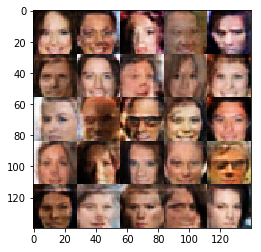

Epoch 2/2... Discriminator Loss: 0.7516... Generator Loss: 1.1629
Epoch 2/2... Discriminator Loss: 1.0432... Generator Loss: 0.7171
Epoch 2/2... Discriminator Loss: 0.8576... Generator Loss: 0.8579
Epoch 2/2... Discriminator Loss: 1.0841... Generator Loss: 0.5623
Epoch 2/2... Discriminator Loss: 1.5309... Generator Loss: 0.3178
Epoch 2/2... Discriminator Loss: 1.4137... Generator Loss: 0.3547
Epoch 2/2... Discriminator Loss: 1.3653... Generator Loss: 0.3819
Epoch 2/2... Discriminator Loss: 1.4728... Generator Loss: 0.3265
Epoch 2/2... Discriminator Loss: 1.1042... Generator Loss: 0.6183
Epoch 2/2... Discriminator Loss: 0.7716... Generator Loss: 0.9930


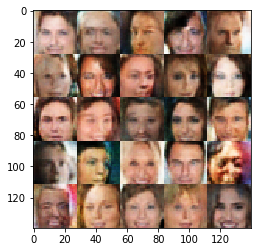

Epoch 2/2... Discriminator Loss: 0.8603... Generator Loss: 0.8616
Epoch 2/2... Discriminator Loss: 1.4679... Generator Loss: 0.3256
Epoch 2/2... Discriminator Loss: 1.0263... Generator Loss: 0.6142
Epoch 2/2... Discriminator Loss: 0.9011... Generator Loss: 0.9852
Epoch 2/2... Discriminator Loss: 1.1013... Generator Loss: 0.7901
Epoch 2/2... Discriminator Loss: 1.2091... Generator Loss: 0.5231
Epoch 2/2... Discriminator Loss: 0.7263... Generator Loss: 1.2955
Epoch 2/2... Discriminator Loss: 0.7968... Generator Loss: 1.0024
Epoch 2/2... Discriminator Loss: 1.0732... Generator Loss: 0.7740
Epoch 2/2... Discriminator Loss: 1.0682... Generator Loss: 0.6089


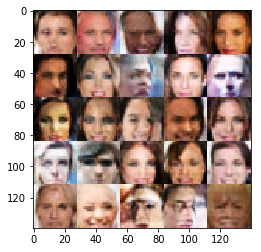

Epoch 2/2... Discriminator Loss: 1.0938... Generator Loss: 0.6136
Epoch 2/2... Discriminator Loss: 0.8779... Generator Loss: 1.0425
Epoch 2/2... Discriminator Loss: 0.8978... Generator Loss: 0.7592
Epoch 2/2... Discriminator Loss: 0.7428... Generator Loss: 1.1291
Epoch 2/2... Discriminator Loss: 0.7497... Generator Loss: 0.8901
Epoch 2/2... Discriminator Loss: 0.6678... Generator Loss: 1.2290
Epoch 2/2... Discriminator Loss: 1.2548... Generator Loss: 0.5791
Epoch 2/2... Discriminator Loss: 0.8600... Generator Loss: 0.7672
Epoch 2/2... Discriminator Loss: 1.0568... Generator Loss: 0.5745
Epoch 2/2... Discriminator Loss: 0.9942... Generator Loss: 0.8128


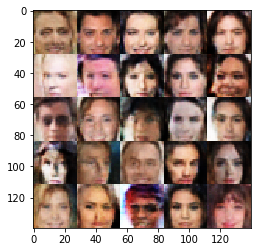

Epoch 2/2... Discriminator Loss: 0.9765... Generator Loss: 0.6492
Epoch 2/2... Discriminator Loss: 0.9011... Generator Loss: 0.8524
Epoch 2/2... Discriminator Loss: 1.5376... Generator Loss: 0.3018
Epoch 2/2... Discriminator Loss: 1.0605... Generator Loss: 0.5922
Epoch 2/2... Discriminator Loss: 1.3210... Generator Loss: 0.3916
Epoch 2/2... Discriminator Loss: 1.1368... Generator Loss: 1.8377
Epoch 2/2... Discriminator Loss: 1.1875... Generator Loss: 0.4917
Epoch 2/2... Discriminator Loss: 0.7532... Generator Loss: 1.3057
Epoch 2/2... Discriminator Loss: 1.2657... Generator Loss: 0.4127
Epoch 2/2... Discriminator Loss: 1.4078... Generator Loss: 0.3501


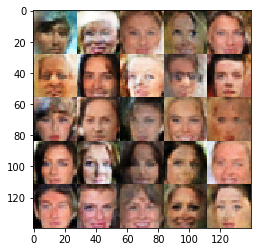

Epoch 2/2... Discriminator Loss: 1.0485... Generator Loss: 0.6272
Epoch 2/2... Discriminator Loss: 1.0745... Generator Loss: 0.6023
Epoch 2/2... Discriminator Loss: 0.7176... Generator Loss: 1.1562
Epoch 2/2... Discriminator Loss: 1.1746... Generator Loss: 0.5125
Epoch 2/2... Discriminator Loss: 1.0056... Generator Loss: 0.9656
Epoch 2/2... Discriminator Loss: 1.2162... Generator Loss: 0.5615
Epoch 2/2... Discriminator Loss: 1.0794... Generator Loss: 0.6788
Epoch 2/2... Discriminator Loss: 0.8977... Generator Loss: 0.8390
Epoch 2/2... Discriminator Loss: 1.2658... Generator Loss: 0.4706
Epoch 2/2... Discriminator Loss: 1.3127... Generator Loss: 0.4900


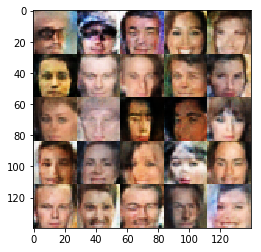

Epoch 2/2... Discriminator Loss: 1.4057... Generator Loss: 0.3556
Epoch 2/2... Discriminator Loss: 0.9221... Generator Loss: 0.7079
Epoch 2/2... Discriminator Loss: 0.9800... Generator Loss: 0.6460
Epoch 2/2... Discriminator Loss: 0.9875... Generator Loss: 1.0524
Epoch 2/2... Discriminator Loss: 1.0768... Generator Loss: 1.0937
Epoch 2/2... Discriminator Loss: 1.0752... Generator Loss: 0.8422
Epoch 2/2... Discriminator Loss: 1.7262... Generator Loss: 0.2607
Epoch 2/2... Discriminator Loss: 1.0916... Generator Loss: 0.8898
Epoch 2/2... Discriminator Loss: 0.8588... Generator Loss: 0.8556
Epoch 2/2... Discriminator Loss: 0.4707... Generator Loss: 1.2732


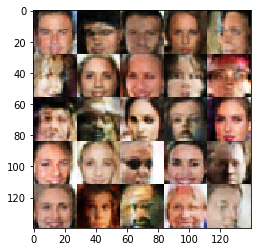

Epoch 2/2... Discriminator Loss: 1.5403... Generator Loss: 0.3330
Epoch 2/2... Discriminator Loss: 1.1660... Generator Loss: 0.4976
Epoch 2/2... Discriminator Loss: 1.1811... Generator Loss: 0.6149
Epoch 2/2... Discriminator Loss: 1.2313... Generator Loss: 0.4658
Epoch 2/2... Discriminator Loss: 1.0301... Generator Loss: 0.5805
Epoch 2/2... Discriminator Loss: 1.4164... Generator Loss: 0.3851
Epoch 2/2... Discriminator Loss: 1.0666... Generator Loss: 0.5716
Epoch 2/2... Discriminator Loss: 0.9866... Generator Loss: 0.6128
Epoch 2/2... Discriminator Loss: 0.6717... Generator Loss: 1.1967
Epoch 2/2... Discriminator Loss: 1.3042... Generator Loss: 0.4220


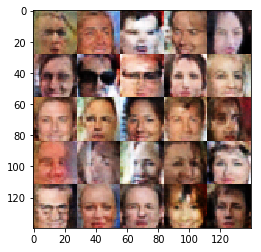

Epoch 2/2... Discriminator Loss: 1.2441... Generator Loss: 0.5221
Epoch 2/2... Discriminator Loss: 0.9238... Generator Loss: 0.8911
Epoch 2/2... Discriminator Loss: 0.7400... Generator Loss: 1.0261
Epoch 2/2... Discriminator Loss: 0.7890... Generator Loss: 1.1339
Epoch 2/2... Discriminator Loss: 1.6568... Generator Loss: 2.3466
Epoch 2/2... Discriminator Loss: 1.0899... Generator Loss: 0.7064
Epoch 2/2... Discriminator Loss: 0.6304... Generator Loss: 1.1361
Epoch 2/2... Discriminator Loss: 0.7231... Generator Loss: 0.9465
Epoch 2/2... Discriminator Loss: 1.1625... Generator Loss: 0.6110
Epoch 2/2... Discriminator Loss: 1.4655... Generator Loss: 0.3380


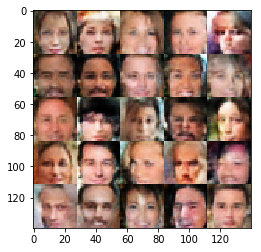

Epoch 2/2... Discriminator Loss: 0.8690... Generator Loss: 0.7562
Epoch 2/2... Discriminator Loss: 1.0571... Generator Loss: 0.6742
Epoch 2/2... Discriminator Loss: 1.0030... Generator Loss: 0.6383
Epoch 2/2... Discriminator Loss: 0.4434... Generator Loss: 1.5464
Epoch 2/2... Discriminator Loss: 0.7244... Generator Loss: 1.1925
Epoch 2/2... Discriminator Loss: 1.1908... Generator Loss: 0.5364
Epoch 2/2... Discriminator Loss: 1.1593... Generator Loss: 0.7772
Epoch 2/2... Discriminator Loss: 0.9009... Generator Loss: 0.8427
Epoch 2/2... Discriminator Loss: 0.8605... Generator Loss: 1.2124
Epoch 2/2... Discriminator Loss: 1.0490... Generator Loss: 0.7600


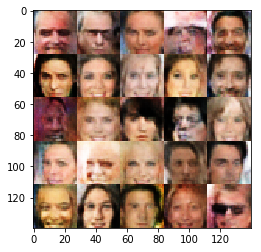

Epoch 2/2... Discriminator Loss: 1.2802... Generator Loss: 0.3853
Epoch 2/2... Discriminator Loss: 0.7547... Generator Loss: 1.2148
Epoch 2/2... Discriminator Loss: 0.7944... Generator Loss: 1.5059
Epoch 2/2... Discriminator Loss: 1.0114... Generator Loss: 0.6210
Epoch 2/2... Discriminator Loss: 1.2849... Generator Loss: 1.9293
Epoch 2/2... Discriminator Loss: 1.0356... Generator Loss: 0.6419
Epoch 2/2... Discriminator Loss: 1.1079... Generator Loss: 0.5986
Epoch 2/2... Discriminator Loss: 1.1481... Generator Loss: 0.5557
Epoch 2/2... Discriminator Loss: 1.1419... Generator Loss: 0.5421
Epoch 2/2... Discriminator Loss: 0.8164... Generator Loss: 1.1148


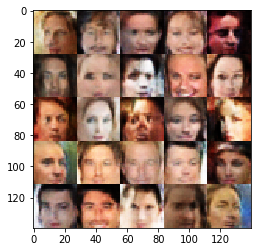

Epoch 2/2... Discriminator Loss: 0.6375... Generator Loss: 1.0479
Epoch 2/2... Discriminator Loss: 1.0922... Generator Loss: 0.6186
Epoch 2/2... Discriminator Loss: 1.3339... Generator Loss: 0.5146
Epoch 2/2... Discriminator Loss: 0.8809... Generator Loss: 0.8888
Epoch 2/2... Discriminator Loss: 0.9894... Generator Loss: 0.5953
Epoch 2/2... Discriminator Loss: 0.8861... Generator Loss: 0.8566
Epoch 2/2... Discriminator Loss: 1.5585... Generator Loss: 0.2903
Epoch 2/2... Discriminator Loss: 0.9910... Generator Loss: 0.5980
Epoch 2/2... Discriminator Loss: 1.1896... Generator Loss: 0.5180
Epoch 2/2... Discriminator Loss: 1.0487... Generator Loss: 0.6571


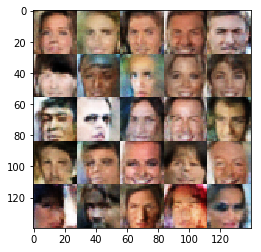

Epoch 2/2... Discriminator Loss: 0.6496... Generator Loss: 1.0654
Epoch 2/2... Discriminator Loss: 1.3467... Generator Loss: 0.4592
Epoch 2/2... Discriminator Loss: 1.1931... Generator Loss: 0.5643
Epoch 2/2... Discriminator Loss: 1.2556... Generator Loss: 0.4643
Epoch 2/2... Discriminator Loss: 0.9824... Generator Loss: 0.6157
Epoch 2/2... Discriminator Loss: 1.2551... Generator Loss: 0.4430
Epoch 2/2... Discriminator Loss: 1.1714... Generator Loss: 0.5082
Epoch 2/2... Discriminator Loss: 1.6173... Generator Loss: 0.3472
Epoch 2/2... Discriminator Loss: 1.0691... Generator Loss: 0.6930
Epoch 2/2... Discriminator Loss: 0.9482... Generator Loss: 0.7854


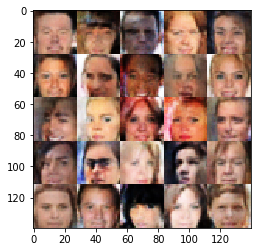

Epoch 2/2... Discriminator Loss: 1.0859... Generator Loss: 0.6065
Epoch 2/2... Discriminator Loss: 0.9222... Generator Loss: 0.6413
Epoch 2/2... Discriminator Loss: 0.9408... Generator Loss: 0.9020
Epoch 2/2... Discriminator Loss: 1.0878... Generator Loss: 0.5830
Epoch 2/2... Discriminator Loss: 1.0788... Generator Loss: 0.5701
Epoch 2/2... Discriminator Loss: 0.9964... Generator Loss: 0.6466
Epoch 2/2... Discriminator Loss: 1.0158... Generator Loss: 1.0000
Epoch 2/2... Discriminator Loss: 0.8200... Generator Loss: 0.9537
Epoch 2/2... Discriminator Loss: 0.6947... Generator Loss: 1.1566
Epoch 2/2... Discriminator Loss: 0.8236... Generator Loss: 1.0427


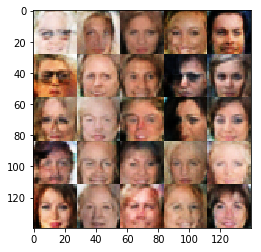

Epoch 2/2... Discriminator Loss: 1.2264... Generator Loss: 0.7994
Epoch 2/2... Discriminator Loss: 1.5467... Generator Loss: 0.3033
Epoch 2/2... Discriminator Loss: 0.7443... Generator Loss: 1.0298
Epoch 2/2... Discriminator Loss: 0.9464... Generator Loss: 0.7506
Epoch 2/2... Discriminator Loss: 0.8838... Generator Loss: 1.5763
Epoch 2/2... Discriminator Loss: 1.2900... Generator Loss: 0.4555
Epoch 2/2... Discriminator Loss: 1.1728... Generator Loss: 0.5368
Epoch 2/2... Discriminator Loss: 1.0407... Generator Loss: 0.9675
Epoch 2/2... Discriminator Loss: 0.7070... Generator Loss: 1.4703
Epoch 2/2... Discriminator Loss: 1.2444... Generator Loss: 0.4264


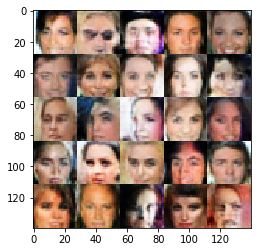

Epoch 2/2... Discriminator Loss: 1.1195... Generator Loss: 0.5498
Epoch 2/2... Discriminator Loss: 1.6276... Generator Loss: 0.3239
Epoch 2/2... Discriminator Loss: 0.8904... Generator Loss: 0.8385
Epoch 2/2... Discriminator Loss: 0.9334... Generator Loss: 0.6883
Epoch 2/2... Discriminator Loss: 1.0127... Generator Loss: 0.6334
Epoch 2/2... Discriminator Loss: 1.1587... Generator Loss: 0.5161
Epoch 2/2... Discriminator Loss: 1.6503... Generator Loss: 0.2765
Epoch 2/2... Discriminator Loss: 0.9219... Generator Loss: 0.6969
Epoch 2/2... Discriminator Loss: 1.2374... Generator Loss: 1.0801
Epoch 2/2... Discriminator Loss: 1.0760... Generator Loss: 0.5618


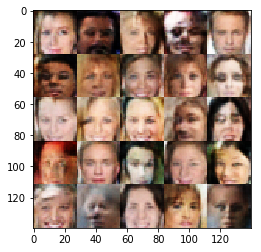

Epoch 2/2... Discriminator Loss: 1.0138... Generator Loss: 0.6333
Epoch 2/2... Discriminator Loss: 0.7374... Generator Loss: 0.9294
Epoch 2/2... Discriminator Loss: 0.7865... Generator Loss: 0.9562
Epoch 2/2... Discriminator Loss: 0.7424... Generator Loss: 1.1596
Epoch 2/2... Discriminator Loss: 1.2150... Generator Loss: 0.4815
Epoch 2/2... Discriminator Loss: 1.0565... Generator Loss: 0.5662
Epoch 2/2... Discriminator Loss: 1.4013... Generator Loss: 0.5020
Epoch 2/2... Discriminator Loss: 1.0445... Generator Loss: 0.5917
Epoch 2/2... Discriminator Loss: 1.1684... Generator Loss: 0.5379
Epoch 2/2... Discriminator Loss: 1.7124... Generator Loss: 0.2859


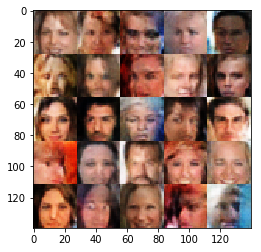

Epoch 2/2... Discriminator Loss: 1.5579... Generator Loss: 0.3478
Epoch 2/2... Discriminator Loss: 1.3883... Generator Loss: 0.3711
Epoch 2/2... Discriminator Loss: 0.6938... Generator Loss: 0.9867
Epoch 2/2... Discriminator Loss: 0.6879... Generator Loss: 1.0997
Epoch 2/2... Discriminator Loss: 1.3454... Generator Loss: 0.3792
Epoch 2/2... Discriminator Loss: 1.1979... Generator Loss: 0.5306
Epoch 2/2... Discriminator Loss: 1.2282... Generator Loss: 0.4648
Epoch 2/2... Discriminator Loss: 0.9755... Generator Loss: 0.7778
Epoch 2/2... Discriminator Loss: 0.9307... Generator Loss: 0.8788
Epoch 2/2... Discriminator Loss: 0.3883... Generator Loss: 1.3597


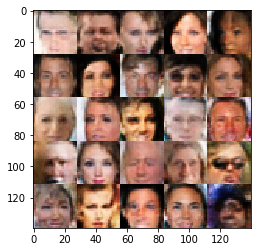

Epoch 2/2... Discriminator Loss: 0.9198... Generator Loss: 1.0429
Epoch 2/2... Discriminator Loss: 1.0960... Generator Loss: 0.6063
Epoch 2/2... Discriminator Loss: 1.4416... Generator Loss: 0.3417
Epoch 2/2... Discriminator Loss: 0.9287... Generator Loss: 0.9435
Epoch 2/2... Discriminator Loss: 0.9263... Generator Loss: 0.6510
Epoch 2/2... Discriminator Loss: 0.8943... Generator Loss: 0.6700
Epoch 2/2... Discriminator Loss: 1.4889... Generator Loss: 0.3693
Epoch 2/2... Discriminator Loss: 1.2172... Generator Loss: 0.4474
Epoch 2/2... Discriminator Loss: 1.0034... Generator Loss: 0.9079
Epoch 2/2... Discriminator Loss: 0.6961... Generator Loss: 1.1791


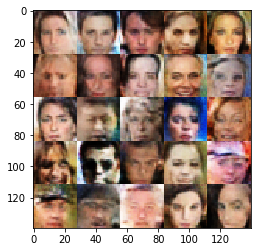

Epoch 2/2... Discriminator Loss: 0.7535... Generator Loss: 1.0223
Epoch 2/2... Discriminator Loss: 1.3828... Generator Loss: 0.3866
Epoch 2/2... Discriminator Loss: 0.7547... Generator Loss: 1.0094
Epoch 2/2... Discriminator Loss: 1.4972... Generator Loss: 0.3241
Epoch 2/2... Discriminator Loss: 1.1523... Generator Loss: 0.7827
Epoch 2/2... Discriminator Loss: 0.9957... Generator Loss: 0.6087
Epoch 2/2... Discriminator Loss: 0.9978... Generator Loss: 0.9628
Epoch 2/2... Discriminator Loss: 0.9039... Generator Loss: 1.1623
Epoch 2/2... Discriminator Loss: 0.7840... Generator Loss: 0.8242
Epoch 2/2... Discriminator Loss: 1.5741... Generator Loss: 0.5202


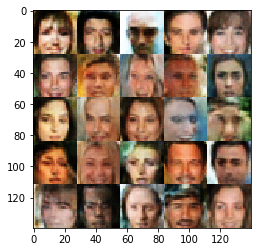

Epoch 2/2... Discriminator Loss: 1.0096... Generator Loss: 0.6021
Epoch 2/2... Discriminator Loss: 0.5508... Generator Loss: 1.2174
Epoch 2/2... Discriminator Loss: 1.3475... Generator Loss: 0.3906
Epoch 2/2... Discriminator Loss: 0.9982... Generator Loss: 0.6551
Epoch 2/2... Discriminator Loss: 0.9057... Generator Loss: 0.6406
Epoch 2/2... Discriminator Loss: 1.3410... Generator Loss: 0.4246
Epoch 2/2... Discriminator Loss: 0.9208... Generator Loss: 0.7625
Epoch 2/2... Discriminator Loss: 1.0762... Generator Loss: 0.6284
Epoch 2/2... Discriminator Loss: 1.6907... Generator Loss: 0.2571
Epoch 2/2... Discriminator Loss: 1.2274... Generator Loss: 0.5029


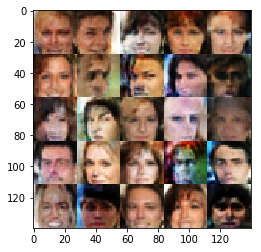

Epoch 2/2... Discriminator Loss: 1.3747... Generator Loss: 0.3616
Epoch 2/2... Discriminator Loss: 0.9939... Generator Loss: 0.8625
Epoch 2/2... Discriminator Loss: 0.9100... Generator Loss: 0.8067
Epoch 2/2... Discriminator Loss: 1.6697... Generator Loss: 0.2846
Epoch 2/2... Discriminator Loss: 0.7868... Generator Loss: 1.2631
Epoch 2/2... Discriminator Loss: 1.1142... Generator Loss: 0.5274
Epoch 2/2... Discriminator Loss: 0.9528... Generator Loss: 0.7028
Epoch 2/2... Discriminator Loss: 0.7599... Generator Loss: 1.1549
Epoch 2/2... Discriminator Loss: 0.8238... Generator Loss: 1.0475
Epoch 2/2... Discriminator Loss: 0.8855... Generator Loss: 1.2013


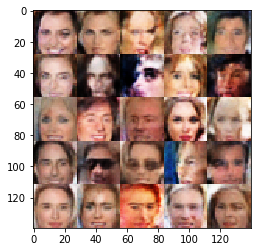

Epoch 2/2... Discriminator Loss: 0.9956... Generator Loss: 0.8009
Epoch 2/2... Discriminator Loss: 0.9024... Generator Loss: 0.7428
Epoch 2/2... Discriminator Loss: 0.7593... Generator Loss: 1.1055
Epoch 2/2... Discriminator Loss: 0.8415... Generator Loss: 1.1392
Epoch 2/2... Discriminator Loss: 1.0189... Generator Loss: 0.6277
Epoch 2/2... Discriminator Loss: 0.7103... Generator Loss: 1.0137
Epoch 2/2... Discriminator Loss: 1.0003... Generator Loss: 0.6550
Epoch 2/2... Discriminator Loss: 1.0548... Generator Loss: 0.6005
Epoch 2/2... Discriminator Loss: 0.7811... Generator Loss: 0.8816
Epoch 2/2... Discriminator Loss: 1.3536... Generator Loss: 0.3845


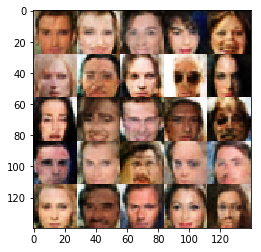

Epoch 2/2... Discriminator Loss: 1.2747... Generator Loss: 0.4370
Epoch 2/2... Discriminator Loss: 1.4896... Generator Loss: 0.3441
Epoch 2/2... Discriminator Loss: 1.7846... Generator Loss: 0.4030
Epoch 2/2... Discriminator Loss: 1.2150... Generator Loss: 0.4507
Epoch 2/2... Discriminator Loss: 0.9523... Generator Loss: 0.6550
Epoch 2/2... Discriminator Loss: 1.0288... Generator Loss: 0.5910
Epoch 2/2... Discriminator Loss: 1.0697... Generator Loss: 0.5469
Epoch 2/2... Discriminator Loss: 1.2230... Generator Loss: 0.4682
Epoch 2/2... Discriminator Loss: 1.0172... Generator Loss: 0.6421
Epoch 2/2... Discriminator Loss: 1.1599... Generator Loss: 0.5980


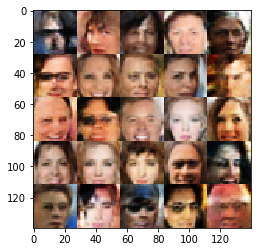

Epoch 2/2... Discriminator Loss: 0.9674... Generator Loss: 1.0994
Epoch 2/2... Discriminator Loss: 1.1110... Generator Loss: 0.5567
Epoch 2/2... Discriminator Loss: 1.7927... Generator Loss: 0.2307
Epoch 2/2... Discriminator Loss: 0.7376... Generator Loss: 1.1434
Epoch 2/2... Discriminator Loss: 0.9194... Generator Loss: 0.7260
Epoch 2/2... Discriminator Loss: 1.2255... Generator Loss: 0.4319
Epoch 2/2... Discriminator Loss: 0.9499... Generator Loss: 0.7617
Epoch 2/2... Discriminator Loss: 1.1740... Generator Loss: 0.5476
Epoch 2/2... Discriminator Loss: 1.1150... Generator Loss: 0.6070
Epoch 2/2... Discriminator Loss: 1.8599... Generator Loss: 0.2152


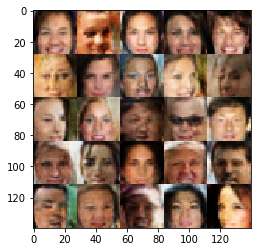

Epoch 2/2... Discriminator Loss: 0.9802... Generator Loss: 0.7309
Epoch 2/2... Discriminator Loss: 1.0766... Generator Loss: 0.5550
Epoch 2/2... Discriminator Loss: 0.7804... Generator Loss: 1.3724
Epoch 2/2... Discriminator Loss: 0.9729... Generator Loss: 0.6677
Epoch 2/2... Discriminator Loss: 1.0074... Generator Loss: 0.5790
Epoch 2/2... Discriminator Loss: 0.4621... Generator Loss: 1.4522
Epoch 2/2... Discriminator Loss: 1.1608... Generator Loss: 0.5334
Epoch 2/2... Discriminator Loss: 1.5824... Generator Loss: 0.2738
Epoch 2/2... Discriminator Loss: 1.1819... Generator Loss: 0.5009
Epoch 2/2... Discriminator Loss: 1.0743... Generator Loss: 0.5396


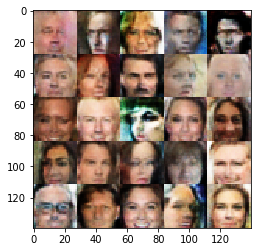

Epoch 2/2... Discriminator Loss: 1.0300... Generator Loss: 0.6270
Epoch 2/2... Discriminator Loss: 0.9719... Generator Loss: 0.7816
Epoch 2/2... Discriminator Loss: 1.2362... Generator Loss: 0.4712
Epoch 2/2... Discriminator Loss: 1.1023... Generator Loss: 0.6300
Epoch 2/2... Discriminator Loss: 1.0826... Generator Loss: 0.9064
Epoch 2/2... Discriminator Loss: 0.8009... Generator Loss: 0.9132
Epoch 2/2... Discriminator Loss: 0.8863... Generator Loss: 1.1178
Epoch 2/2... Discriminator Loss: 1.4545... Generator Loss: 0.3324
Epoch 2/2... Discriminator Loss: 1.2811... Generator Loss: 0.5053
Epoch 2/2... Discriminator Loss: 1.1783... Generator Loss: 0.6482


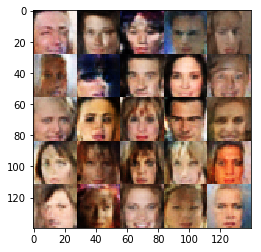

Epoch 2/2... Discriminator Loss: 1.2710... Generator Loss: 0.4714
Epoch 2/2... Discriminator Loss: 1.4501... Generator Loss: 0.3456
Epoch 2/2... Discriminator Loss: 1.1952... Generator Loss: 0.5279
Epoch 2/2... Discriminator Loss: 1.0120... Generator Loss: 1.2256
Epoch 2/2... Discriminator Loss: 1.4161... Generator Loss: 0.3635
Epoch 2/2... Discriminator Loss: 1.2011... Generator Loss: 0.5162
Epoch 2/2... Discriminator Loss: 0.8881... Generator Loss: 0.8365
Epoch 2/2... Discriminator Loss: 1.0897... Generator Loss: 0.5353
Epoch 2/2... Discriminator Loss: 1.0790... Generator Loss: 0.5891
Epoch 2/2... Discriminator Loss: 0.9159... Generator Loss: 0.6673


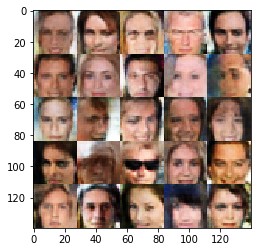

Epoch 2/2... Discriminator Loss: 0.8051... Generator Loss: 0.8070
Epoch 2/2... Discriminator Loss: 1.0435... Generator Loss: 0.6648
Epoch 2/2... Discriminator Loss: 1.2634... Generator Loss: 0.4133
Epoch 2/2... Discriminator Loss: 0.9131... Generator Loss: 0.7201
Epoch 2/2... Discriminator Loss: 0.9456... Generator Loss: 0.7769
Epoch 2/2... Discriminator Loss: 1.2165... Generator Loss: 0.4931
Epoch 2/2... Discriminator Loss: 1.0305... Generator Loss: 0.6221
Epoch 2/2... Discriminator Loss: 1.0907... Generator Loss: 0.5447
Epoch 2/2... Discriminator Loss: 1.1244... Generator Loss: 0.7466
Epoch 2/2... Discriminator Loss: 0.9380... Generator Loss: 0.7623


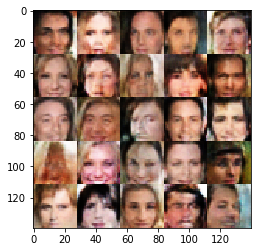

Epoch 2/2... Discriminator Loss: 1.4505... Generator Loss: 0.3563
Epoch 2/2... Discriminator Loss: 0.8825... Generator Loss: 0.7309
Epoch 2/2... Discriminator Loss: 0.7420... Generator Loss: 0.8913
Epoch 2/2... Discriminator Loss: 0.5433... Generator Loss: 1.1488
Epoch 2/2... Discriminator Loss: 1.8011... Generator Loss: 0.2372
Epoch 2/2... Discriminator Loss: 1.2500... Generator Loss: 0.4351
Epoch 2/2... Discriminator Loss: 1.1376... Generator Loss: 0.6179
Epoch 2/2... Discriminator Loss: 0.9436... Generator Loss: 1.1709
Epoch 2/2... Discriminator Loss: 0.7362... Generator Loss: 1.1221
Epoch 2/2... Discriminator Loss: 2.3487... Generator Loss: 0.1305


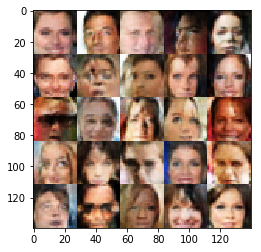

Epoch 2/2... Discriminator Loss: 0.9677... Generator Loss: 0.9353
Epoch 2/2... Discriminator Loss: 1.0009... Generator Loss: 0.6548
Epoch 2/2... Discriminator Loss: 1.1971... Generator Loss: 0.4869
Epoch 2/2... Discriminator Loss: 1.0563... Generator Loss: 0.8510
Epoch 2/2... Discriminator Loss: 1.0611... Generator Loss: 0.5700
Epoch 2/2... Discriminator Loss: 0.4919... Generator Loss: 1.3536
Epoch 2/2... Discriminator Loss: 0.7818... Generator Loss: 1.1264
Epoch 2/2... Discriminator Loss: 0.7738... Generator Loss: 1.2212
Epoch 2/2... Discriminator Loss: 0.8326... Generator Loss: 0.8715
Epoch 2/2... Discriminator Loss: 1.0632... Generator Loss: 0.5998


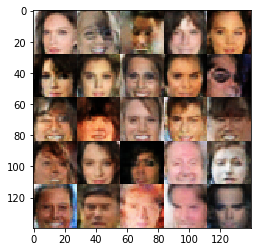

Epoch 2/2... Discriminator Loss: 1.3127... Generator Loss: 0.4107
Epoch 2/2... Discriminator Loss: 0.8405... Generator Loss: 0.9074
Epoch 2/2... Discriminator Loss: 1.1708... Generator Loss: 0.5148
Epoch 2/2... Discriminator Loss: 0.9928... Generator Loss: 0.6708
Epoch 2/2... Discriminator Loss: 1.3832... Generator Loss: 0.4027
Epoch 2/2... Discriminator Loss: 0.6645... Generator Loss: 1.1570
Epoch 2/2... Discriminator Loss: 1.2096... Generator Loss: 0.4732
Epoch 2/2... Discriminator Loss: 1.3055... Generator Loss: 0.4415
Epoch 2/2... Discriminator Loss: 1.1679... Generator Loss: 0.5642
Epoch 2/2... Discriminator Loss: 0.7640... Generator Loss: 1.1452


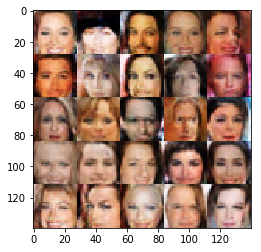

Epoch 2/2... Discriminator Loss: 1.0196... Generator Loss: 0.7206
Epoch 2/2... Discriminator Loss: 1.0721... Generator Loss: 0.6150
Epoch 2/2... Discriminator Loss: 1.0428... Generator Loss: 0.6180
Epoch 2/2... Discriminator Loss: 1.0720... Generator Loss: 0.6258
Epoch 2/2... Discriminator Loss: 1.0938... Generator Loss: 0.6054
Epoch 2/2... Discriminator Loss: 0.8322... Generator Loss: 0.7192
Epoch 2/2... Discriminator Loss: 0.7603... Generator Loss: 0.9399
Epoch 2/2... Discriminator Loss: 1.3501... Generator Loss: 0.3993
Epoch 2/2... Discriminator Loss: 0.7482... Generator Loss: 1.0491
Epoch 2/2... Discriminator Loss: 1.3306... Generator Loss: 0.4641


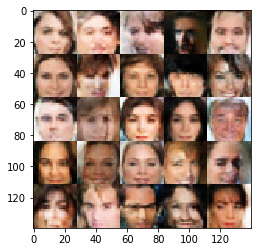

Epoch 2/2... Discriminator Loss: 0.9963... Generator Loss: 0.7588
Epoch 2/2... Discriminator Loss: 1.0410... Generator Loss: 0.5909
Epoch 2/2... Discriminator Loss: 1.0653... Generator Loss: 0.5494
Epoch 2/2... Discriminator Loss: 0.9724... Generator Loss: 0.7171
Epoch 2/2... Discriminator Loss: 0.9092... Generator Loss: 1.0027
Epoch 2/2... Discriminator Loss: 0.6647... Generator Loss: 1.2092
Epoch 2/2... Discriminator Loss: 0.6541... Generator Loss: 1.3638
Epoch 2/2... Discriminator Loss: 1.1829... Generator Loss: 0.5765
Epoch 2/2... Discriminator Loss: 1.0248... Generator Loss: 0.8345
Epoch 2/2... Discriminator Loss: 0.7273... Generator Loss: 1.0946


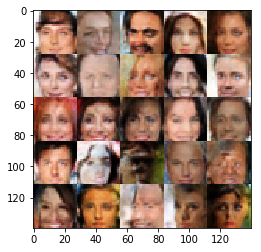

Epoch 2/2... Discriminator Loss: 1.1877... Generator Loss: 0.5276
Epoch 2/2... Discriminator Loss: 0.9542... Generator Loss: 0.7443
Epoch 2/2... Discriminator Loss: 0.8455... Generator Loss: 0.9657
Epoch 2/2... Discriminator Loss: 1.0712... Generator Loss: 0.8605
Epoch 2/2... Discriminator Loss: 1.5702... Generator Loss: 0.3223
Epoch 2/2... Discriminator Loss: 1.1133... Generator Loss: 0.6401
Epoch 2/2... Discriminator Loss: 0.6082... Generator Loss: 1.1290
Epoch 2/2... Discriminator Loss: 0.7969... Generator Loss: 0.8563
Epoch 2/2... Discriminator Loss: 0.8145... Generator Loss: 0.8456
Epoch 2/2... Discriminator Loss: 0.9852... Generator Loss: 0.9658


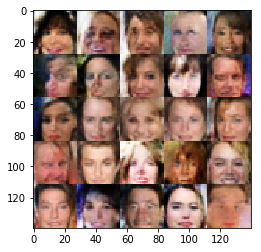

Epoch 2/2... Discriminator Loss: 0.9022... Generator Loss: 0.7772
Epoch 2/2... Discriminator Loss: 0.8528... Generator Loss: 0.9293
Epoch 2/2... Discriminator Loss: 0.8700... Generator Loss: 0.7484
Epoch 2/2... Discriminator Loss: 0.8840... Generator Loss: 0.7580
Epoch 2/2... Discriminator Loss: 1.4765... Generator Loss: 0.3744
Epoch 2/2... Discriminator Loss: 1.4146... Generator Loss: 0.3363
Epoch 2/2... Discriminator Loss: 1.7309... Generator Loss: 0.2686
Epoch 2/2... Discriminator Loss: 0.9150... Generator Loss: 0.8200
Epoch 2/2... Discriminator Loss: 0.8843... Generator Loss: 0.8957
Epoch 2/2... Discriminator Loss: 0.9343... Generator Loss: 0.7941


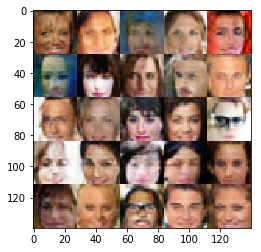

Epoch 2/2... Discriminator Loss: 0.9045... Generator Loss: 0.8979
Epoch 2/2... Discriminator Loss: 0.7417... Generator Loss: 0.9511
Epoch 2/2... Discriminator Loss: 1.6321... Generator Loss: 0.2800
Epoch 2/2... Discriminator Loss: 1.1025... Generator Loss: 0.6588
Epoch 2/2... Discriminator Loss: 1.1218... Generator Loss: 0.8177
Epoch 2/2... Discriminator Loss: 0.7104... Generator Loss: 1.5572


In [94]:
batch_size = 32
z_dim = 200
learning_rate = .0001
beta1 = .3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    losses = train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

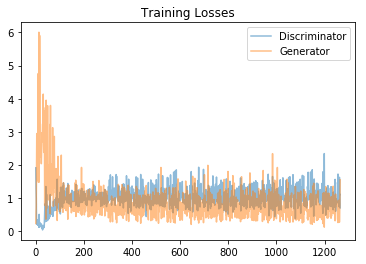

In [95]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.

Set//Model//Batch Size//Z Dim//Learning Rate//Beta1//D_Loss//G_Loss//Optimizer//Extra gen//Xavier Kern//Batch*=2//Image Quality	//Notes

MNIST	A	64	100	0.0001	0.5	0.206	2.2079	Adam				ok		
MNIST	B	64	100	0.0001	0.5	0.1626	2.7554	Adam				ok		
MNIST	B	64	100	0.0005	0.1	0.0656	3.7595	Adam				meh		
MNIST	A	64	100	0.0002	0.2	0.4394	1.2432	Adam				ok		
MNIST	A	128	100	0.0001	0.3	0.3473	1.699	Adam				poor		
MNIST	A	256	100	0.0001	0.5	0.3548	2.2154	Adam				terrible		
MNIST	A	64	100	0.0001	0.5	0.6728	1.0775	Adam			X	poor		
MNIST	A	32	200	0.0002	0.3	0.5678	1.2664	Adam			X	good		
MNIST	A	32	200	0.0002	0.3	0.7222	0.9603	Adam		X	X	better		
MNIST	A	32	200	0.0002	0.3	1.8124	0.2573	Adam	X	X	X	better	quality is not that much better 
CELEB	A	32	200	0.0002	0.3	1.2216	0.7067	Adam		X	X	good	1 epoch
CELEB	A	32	200	0.0001	0.3	0.7104	1.5574	Adam		X	X			2 epochs. Half learning rate
